In [ ]:
# MIT License
#
#@title Copyright (c) 2021 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

---
# Automating the creation of LULC datasets for Semantic Segmentation
---
Author(s):
*   [Sambhav Singh Rohatgi](https://www.linkedin.com/in/sambhav-singh-rohatgi/), ML engineer and researcher at [SpaceSense](https://www.spacesense.ai/), sambhav@spacesense.ai
*   [Anthony Mucia](https://www.linkedin.com/in/anthonymucia/), Remote Sensing scientist at [SpaceSense](https://www.spacesense.ai/), tony@spacesense.ai

This tutorial demonstrates the development of a generic, reusable and customisable pipeline for preparing land use segmentation datasets using custom vector datasets. Users will learn about processing geospatial data types using geospatial libraries for land cover segmentation applications.


<a href="https://www.spacesense.ai/">
<img src='https://drive.google.com/uc?id=1G6wyjYPSsg1XjId1Jg0ua-5qFXjiTVIQ'>
</a>




# Table of Contents


*   [Overview](#overview)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Background & Prerequisites](#background-and-prereqs)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Dataset Creation Methodology](#methodology)
*   [Segmentation Model training using created dataset](#model-training)
*   [Results & Discussion](#results-and-discussion)
*   [References](#references)


<a name="overview"></a>

---
# 1. Overview
---
Land Use and Land Cover (LULC) datasets represent physical classifications of land types and spatial information over the surface of the Earth. High-resolution and accurate LULC datasets are becoming increasingly important as they can be used in a wide array of applications, e.g. monitoring climate change impacts in agriculture, deforestation, and the carbon cycle.

Major advances in computer vision (CV) over the past decade provide unprecedented opportunities to automate LULC mapping at a massive scale. However, until recently, one major impediment to mapping LULC has been the lack of publicly available large datasets. And even when large vector datasets for LULC mapping are available, the knowledge gap in transforming the input to a dataset of paired satellite images and segmentation masks may prevent wider adoption across the ML community.

In this tutorial, we demonstrate an end-to-end pipeline for LULC dataset preparation which takes vector land cover data and provides a training-ready dataset. Specifically, we use Sentinel-2 satellite imagery and the European Urban Atlas LULC data. The pipeline manages everything from downloading satellite data, to creating and storing encoded segmentation masks and automating data checks. Finally, we then use the resulting dataset to train a semantic segmentation model.

**Objective:** The overall goal of the tutorial is to demonstrate ways for users to create their own custom LULC datasets using combinations of multispectral satellite and vector data. We also provide an introduction to multispectral satellite imagery, discuss challenges in the use of ML for earth observation, and give a brief perspective of the future work in ML for Earth observation.


<a name="climate-impact"></a>

---
# 2. Climate Impact
---

Land cover refers to physical features covering the land such as type of vegetation or constructed objects. Land use refers specifically to the management and activity on the land, such as if a vegetated area is used for agriculture or recreation, or if a constructed area is used for transport or manufacturing [1]. Land use and land cover changes can be both causes and effects of changes in climate. New settlements and constructed areas often remove large swaths of natural land and can result in changing patterns of weather and climate such as increasing temperature [2] and precipitation changes [3].

LULC datasets can be a key tool for monitoring and mitigating climate change impacts on both natural ecosystems and human settlements. Some examples include:

*   Land cover and land use classification can be used for monitoring and estimating building albedo and urban heat island impacts. Even static classification can bring a simplistic estimation of how the constructed environment of cities reflects more visible light, increasing surface albedo, and also retains more heat than most natural environments.
*   Classification of forest and vegetation can be leveraged to monitor the carbon cycle. Dynamic classification, that is creating a series of LULC classificaiton at different points in time, helps to track the advance or retreat of vegetation as well as being able to identify dominant species within that vegetation. This information is key to estimations of the carbon cycle and can improve regional and global tracking of carbon management.
*   Land surface and climate modelling be improved by monitoring the evolution of the land surface and climate under different climate change scenarios. Once again, dynamic classification, and high spatial resolution of LULC datasets can be used in conjunction to better model the land and atmosphere at different temporal scales. Both land surface and climate modelling require accurate descriptions of the surface as forcings to model the interactions between the soil, biosphere, and atmosphere. Accurate and up to date LULC datasets provide improved monitoring and modelling of these important interactions [4].

<a name="target-audience"></a>

---
# 3. Target Audience
---

The primary targets for this tutorial are data scientists and developers working in the ML and geospatial associated industries. Specifically, those within the industries of agriculture, forestry, land monitoring, urban planning and land-surface modelling can benifit from learning the tools and uses surrounding land use and land cover, in addition to how to automatically create LULC datasets using machine learning. The goal of this tutorial is not to provide a LULC dataset that suits every need from every domain, but instead to provide a pipeline template that is modular to allow for every data scientist and developer to plug in their own data, change the model and parameters, and itterate to obtain the best LULC dataset for their own uses. Therefore the audience that can benifit from this tutorial is diverse and cross-domain.

Additional  audiences include those simply interested in learning about climate change and monitoring would be fit as a user. Links to resources are provided wherever necessary for the users to further explore the topic.

<a name="background-and-prereqs"></a>

---
# 4. Background & Prerequisites
---


## 4.1 Vector data versus Raster data

This tutorial involves the processing of both raster and vector geospatial data.

*   **Raster data** is information that is stored in a grid of discrete cells, which can be though of as pixels. In geospatial data each pixel cooresponds to a specific geographic location, and representing a specific sized area (resolution) on the Earth. Image data stored in [Tiff](https://en.wikipedia.org/wiki/TIFF), PNG or JPEG is an example of raster data.

*   **Vector data** is comprised of geometric features created from points, lines, and polygons. Geospatial information is stored in the form of attributes associated to each of these vector features. Vector data can be stored in the form of [geopackages](https://www.geopackage.org/), [shapefiles](https://en.wikipedia.org/wiki/Shapefile), geojsons etc.


Raster data are useful for storing continuous and discrete data in a precise and simply organized way e.g - elevation models and temperature. Sensor observations, specifically aerial and satellite including Sentinel-2, Landsat, and MODIS, are almost always stored in raster formats. Vector models are usually used to store information about locations in a very precise manner, and not wanting to deal with the limitations of pixel size and sensor resolution e.g - geographic boundaries, soil type maps, and areas for landuse segmentation.

This distinction is important when working with both types of geospatial data. When converting a vector into a raster, it is necessary to know the strengths and limitations each type so that one can most effectively conserve the necessary information while making the data fusable with other datasets.

You can read more about Vector and Raster data [here](https://gisgeography.com/spatial-data-types-vector-raster/)


<center><p><p> <img src='https://sqlserverrider.files.wordpress.com/2013/10/raster-vector-gis-i4.jpg' alt="alt" width="60%"/>
</center>


## 4.2 What is Coordinate Reference System (CRS)?

A **Coordinate Reference System (CRS)** is a framework to measure and communicate precise locations on the Earth's surface. A CRS is composed of a coordinate system detailing measurable space a point of origin, axes, and units, a datum which defines the merging of coordinate systems to real locations on the Earth (latitude and longitude), and optionally a map projection to convert spherical coordinatees to cartesian coordinates to display on flat surfaces. The European Petroleum Survey Group (EPSG) has a public registry of spatial reference systems in a set of common codes. One very common example is EPSG:4326, which is based on the WGS 84 geodetic system and is a common standard for global referencing.

The choice of a specific CRS is dependant upon the exact world region of interest and the purpose or end use of the referenced data. Because so many different CRS exist to best suit individual regions and purposes, it is necessary to also be able to transform between any CRSs, which we will see demonstrated when transforming the CRS of the European Urban Atlas.

While geodetics, datums, coordinates, and reference systems are quite a complex subject, the followeing 10 minute video gives a basic overview of the information necessary to understand coordinate reference systems:

<!--
[![IMAGE ALT TEXT HERE](https://img.youtube.com/vi/WWp1k0SlMUU/0.jpg)](https://www.youtube.com/watch?v=WWp1k0SlMUU) -->







In [ ]:
#@title GIS coordinate reference systems
import IPython.display as ipd

html = ipd.display(ipd.HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/WWp1k0SlMUU" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>'))

html

/usr/local/lib/python3.8/dist-packages/IPython/core/display.py:701: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## 4.3 Sentinel-2 Satellite Images

**Overview:**

Sentinel-2(S2) is a pair of European Space Agency (ESA) satellites (Sentinel-2A and Sentinel-2B) in sun-syncronous orbit. Its primary goals are the monitoring of current and changing land surface conditions. These satellites, launched in 2015 (S2-A) and 2017 (S2B) are tasked with providing high resolution, frequent revisits over nearly all of the globe. S2 data is  free and openly available to the public.

**Sensors:**

Both S2 satellites carry a multi-spectral instrument (MSI), which observes 13 spectral channels, beginning with visible, and moving to the near and shortwave infrared spectrum. The blue, green, red, and near infrared bands provide the highest spatial resolution at 10m, with the other 8 bands offering spatial resolutions of 20 and 60m.

The table below shows wavelengths and resolutions of all S2 bands
<center>
<table>
<thead>
<tr><th>Sentinel 2 Bands</th><th>Central Wavelength (µm)</th><th>Resolution (m)</th></tr>
</thead>
<tbody>
<tr><td>Band 1 - Coastal aerosol</td><td>0.443</td><td>60</td></tr>
<tr><td>Band 2 - Blue</td><td>0.490</td><td>10</td></tr>
<tr><td>Band 3 - Green</td><td>0.560</td><td>10</td></tr>
<tr><td>Band 4 - Red</td><td>0.665</td><td>10</td></tr>
<tr><td>Band 5 - Vegetation Red Edge</td><td>0.705</td><td>20</td></tr>
<tr><td>Band 6 - Vegetation Red Edge</td><td>0.740</td><td>20</td></tr>
<tr><td>Band 7 - Vegetation Red Edge</td><td>0.783</td><td>20</td></tr>
<tr><td>Band 8 - NIR</td><td>0.842</td><td>10</td></tr>
<tr><td>Band 8A - Vegetation Red Edge</td><td>0.865</td><td>20</td></tr>
<tr><td>Band 9 - Water vapour</td><td>0.945</td><td>60</td></tr>
<tr><td>Band 10 - SWIR - Cirrus</td><td>1.375</td><td>60</td></tr>
<tr><td>Band 11 - SWIR</td><td>1.610</td><td>20</td></tr>
<tr><td>Band 12 - SWIR</td><td>2.190</td><td>20</td></tr>
</tbody>
</table>
</center>

**Applications:**

With its high resolution and relatively frequent revist time, S2 provides high quality information regarding environmental monitoring, including land cover and land use changes. Additional applications for S2 include agricultural and crop monitoring and management, forest management, coastal monitoring, and natural risk management.

<br>
<center><p><p> <img src='https://www.esa.int/var/esa/storage/images/esa_multimedia/images/2015/03/sentinel-2/15292660-1-eng-GB/Sentinel-2_pillars.jpg' alt="alt" width="60%"/>
</center>

**Co-registration:**

Because we are merging satellite imagery with other geographic data, it is necessary that the geospatial data is aligned. This process is called co-registration, and in its simplist form is matching the geographic coordinates given in the datasets in an overlapping fashion. More advanced methods, which will not be used in this tutorial, are able to match specific features (e.g. buildings, roads, rocks) found in both datasets to correct for imprecise geospatial coordinates in the original datasets. In this tutorial, co-registration is performed by matching the CRS between the Sentinel-2 imagery and the European Urban Atlas, then matching the latitude and longitude coordinates found in both.



## 4.4 Semantic Segmentation
Semantic segmentation tries to assign a class to each pixel in an image. It can be thought of as classification at a pixel level.

Semantic segmentation can be useful for remote sensing imagery as it can be used for tasks such as landuse classification, crop classification, boundary mapping etc.

To understand more about semantic segmentaation, I would recommend this [blog](https://www.jeremyjordan.me/semantic-segmentation/).

<center>
<img src='https://www.jeremyjordan.me/content/images/2018/05/Screen-Shot-2018-05-17-at-9.02.15-PM.png'>
</center>



## 4.5 References

[1] Sleeter, B.M., T. Loveland, G. Domke, N. Herold, J. Wickham, and N. Wood, 2018: Land Cover and Land-Use Change. In Impacts, Risks, and Adaptation in the United States: Fourth National Climate Assessment, Volume II [Reidmiller, D.R., C.W. Avery, D.R. Easterling, K.E. Kunkel, K.L.M. Lewis, T.K. Maycock, and B.C. Stewart (eds.)]. U.S. Global Change Research Program, Washington, DC, USA, pp. 202–231. doi: 10.7930/NCA4.2018.CH5

[2] Kalnay, E., and M. Cai, 2003: Impact of urbanization and land-use change on climate. Nature, 423 (6939), 528–531. doi:10.1038/nature01675.

[3] Pielke, R. A., Sr., J. Adegoke, A. BeltráN-Przekurat, C. A. Hiemstra, J. Lin, U. S. Nair, D. Niyogi, and T. E. Nobis, 2007: An overview of regional land-use and land-cover impacts on rainfall. Tellus B, 59 (3), 587–601. doi:10.1111/j.1600-0889.2007.00251.x.

[4] Reinhart, V., Hoffmann, P., Rechid, D., Böhner, J., and Bechtel, B.: High-resolution land use and land cover dataset for regional climate modelling: a plant functional type map for Europe 2015, Earth Syst. Sci. Data, 14, 1735–1794, https://doi.org/10.5194/essd-14-1735-2022, 2022.

Additional References:

*   https://sentinel.esa.int/web/sentinel/missions/sentinel-2
*   https://www.esri.com/content/dam/esrisites/en-us/media/pdf/teach-with-gis/raster-faster.pdf
* https://gisgeography.com/spatial-data-types-vector-raster/
* https://hatarilabs.com/ih-en/how-many-spectral-bands-have-the-sentinel-2-images



<a name="software-requirements"></a>

---
# 5. Software Requirements
---

This notebook requires geospatial and machine learning libraries. The Python version at the time of this submission in Colab = Python 3.7.14.

Since we are using google colab for the purposes of this tutorial, a lot of the libraries are already preinstalled in the environment. Some of the required additional libraries which are missing are installed in the following cell.


In [ ]:
%%capture
!pip install geopandas==0.10.2
!pip install segmentation-models==1.0.1
!pip install rioxarray==0.9.1
!pip install distinctipy==1.2.2
!apt-get install tree
!pip install --upgrade gdown

In [ ]:
# Import utils
import os
import tqdm
import gdown
import pprint
import json
import random
import urllib.request
from collections import Counter
from statistics import mode

from IPython.display import JSON, GeoJSON
from pycocotools import mask as maskutils
from pycocotools.coco import COCO

# Geospatial libraries
import xarray as xr
import geopandas as gpd
import rioxarray
import shapely

# Computer vision libraries
import cv2

# Data visualization libraries
import distinctipy
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

# Data manipulation libraries
import pandas as pd
import numpy as np

# Machine learning libraries
import tensorflow as tf
import segmentation_models as sm

sm.set_framework('tf.keras')

Segmentation Models: using `keras` framework.


<a name="data-description"></a>
# 6. Data Description and Download


In [ ]:
# Set to False for debugging downloading process
gdown_quiet = True

## 6.1 GeoJSON

GeoJSON is an open standard geospatial data interchange format that represents simple geographic features and their nonspatial attributes. Based on JavaScript Object Notation (JSON), GeoJSON encodes a variety of geographic vector data structures.

A useful tool to view and create new geojsons is [geojson.io](https://geojson.io/#map=2/20.0/0.0). For more information about geojsons, we recommend taking a look at the following article, [More than you ever wanted to know about GeoJSON](https://macwright.com/2015/03/23/geojson-second-bite.html).

For this tutorial we will be using a GeoJSON from Paris. Let's load it up, visualise it, and then verify it on geojson.io.

To visualise the output on geojson.io, open geojson.io and paste the output of the next cell in the JSON tab. Do note that we are printing the output of ```json.dumps``` instead of simply printing the dictionary, this is because python prints strings with single quotes ```'``` instead of ```''``` and this results in a parsing error on geojson.io.

In [ ]:
# Download the geojson from google drive
geojson_save_path = "test.json"
gdrive_path = 'https://drive.google.com/file/d/1LPzl9IJOBOajNq1CW6oYxyeyxEEz7rA7/view?usp=sharing'
gdown.download(
    gdrive_path ,
    geojson_save_path,
    quiet=gdown_quiet,
    fuzzy=True
)

# Open and load data from geojson in the form of a dictionary
with open(geojson_save_path, 'r') as f:
  geojson_data = json.load(f)

print (json.dumps(geojson_data, indent = 4))

{
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {},
            "geometry": {
                "type": "Polygon",
                "coordinates": [
                    [
                        [
                            2.2707366943359375,
                            48.81590713080018
                        ],
                        [
                            2.421283721923828,
                            48.81590713080018
                        ],
                        [
                            2.421283721923828,
                            48.90117643333875
                        ],
                        [
                            2.2707366943359375,
                            48.90117643333875
                        ],
                        [
                            2.2707366943359375,
                            48.81590713080018
                        ]
                    ]
      

What can we infer afte reading the description of the GeoJSON?

1. Looking at the 'type' attribute inside the 'geometry' attribute, we can see that the GeoJSON represents a Polygon.
2. Notice that the first and last array in the coordinates is the same, this is because we are looking at a closed polygon and it has the same start and end point.
3. We see that the top level `type` attribute says `FeatureCollection`. A geojson can store one or multiple geometries, in this case we see that only a single geometry exists within the `features` attribute.

Lets visualise our Polygon on a plot to visualise its shape. We will load the GeoJSON with [**GeoPandas**](https://geopandas.org/en/stable/) since it provides out of the box utilities such as visualisation and reprojection.

                                            geometry
0  POLYGON ((2.27074 48.81591, 2.42128 48.81591, ...


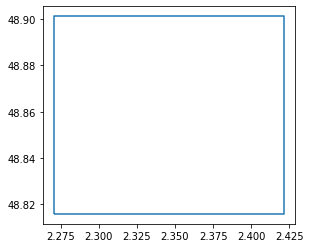

In [ ]:
# load geojson with geopandas
aoi_gdf = gpd.read_file(geojson_save_path)
print(aoi_gdf)

# plot only bounds of the polygon
aoi_gdf.boundary.plot();

## 6.2 Sentinel-2 Satellite Images

Satellite images, such as Sentinel-2, are often freely available from the originating agency (ESA in Sentinel-2's case). However, this is often a manual task to query, filter, select, and download only the scenes one wishes for a region, and thus can be a time consuming chore, especially when this task must be done at scale.

One way that is helping alleviate this tediousness is cloud optimized geotiffs (COGs), which are typical geographically referenced GeoTIFFs, but organized and optimized for cloud workflows on an HTTP file server. COGs enable the query and download of only portions of a file that the user needs (e.g. specificly defined areas of interest, only certain spectral bands), and allow users to quickly select the data of interest and get straight to work. It is for this reason that this work also uses Sentinel-2 COGS to obtain the satellite imagery.

### Copernicus Open Access Hub

The most direct way to access Sentinel-2 imagery is by using the [Scihub GUI web portal](https://scihub.copernicus.eu/dhus/#/home) provided by ESA and Copernicus. After creating an account and logging in, one can use the "Area Mode" tool on the right side of the page to draw a box to limit search results.

<center>
<img src='https://imgur.com/qLfvTSz.png'>
</center>

Using the "Search Criteria" bar on the upper left side of the page, one can select the "Mission: Sentinel-2" checkbox, and the "S2MSI2A" product type from the dropdown list. Then one can search specific time periods through the "Sensing Period" boxes.

<center>
<img src='https://imgur.com/JPdFnU1.png'>
</center>

The S2 tiles matching the search are displayed, and you are now able to select the specific scene of interest. In our case, we know that we wanted the "31UDQ" tile, so we add that to our cart. Because it is from 2018 and is archived ("Offline"), it must be retrieved from the Copernicus servers first, which may take a few minutes, after which it can be downloaded as a .zip archive.

<center>
<img src='https://imgur.com/RFLgvA3.png'>
</center>

The imagery data itself is stored by Sentinel-2 band in GRANULE\L2A_T31UDQ_A017966_20181130T110431\IMG_DATA\ path, and is in the JP2 file format. Each layer can be opened, combined, and converted to other raster formats using the tools of your choosing (QGIS, ArcGIS, Python, R). Here, we simply opened Band 2, 3, 4, and SCL in geopandas, renamed the bands, combined them into an Xarray Dataset, clipped them to a smaller area of interest, then saved the file as a netCDF.  

### Sentinel-2 COGS in Python

As we are already working in Python, using COGs is another method to get level 2 Sentinel-2 data. [This web tutorial](https://carpentries-incubator.github.io/geospatial-python/05-access-data/) demonstrates a simple way to download bands and images for your area of interest.


Now let's access our downloaded image from Sentinel 2 and visualise it.



In [ ]:
# Download S2 image from the drive folder
gdown_quiet = True
S2_save_path = "test.nc"
gdrive_path = 'https://drive.google.com/file/d/1piSW1owoQ0XBX78EkjN8flQki3f1A3BH/view?usp=sharing'
gdown.download(
    gdrive_path,
    S2_save_path,
    quiet=gdown_quiet,
    fuzzy=True
);

Our data is stored in the form of a NetCDF, this data can be loaded using the [**Xarray** ](https://docs.xarray.dev/en/stable/)library. NetCDFs provide a convenient way to store raster geospatial data. **Xarray** also provides a plethora of utility functions for loading, visualising, slicing (numpy and geocoordinate based) etc.

In [ ]:
# open the netCDF and look at the data description
S2_img = xr.open_dataset(S2_save_path)
S2_img

<xarray.Dataset>
Dimensions:      (band: 1, y: 700, x: 1250)
Coordinates:
  * band         (band) int64 1
  * y            (y) float64 48.9 48.9 48.9 48.9 ... 48.82 48.82 48.82 48.82
  * x            (x) float64 2.271 2.271 2.272 2.272 ... 2.42 2.42 2.42 2.42
    spatial_ref  int64 ...
Data variables:
    blue         (band, y, x) float64 ...
    green        (band, y, x) float64 ...
    red          (band, y, x) float64 ...
    SCL          (band, y, x) float64 ...
Attributes:
    valid_percentage_of_pixels:    100.0
    percentage_of_pix_not_cloudy:  85.63503088068728
    date_string:                   2018-11-30
    tile_name:                     S2A_31UDQ_20181130_0_L2A
    grid_mapping:                  spatial_ref

Looking at the xarray dataset description above, we can see that a xarray dataset consists of 3 main data attributes -
1. **Coordinates** - These store the spatio temporal reference coordinate information for our raster data. These can be of N dimensions. Here we see that we have coordinates for the *X* and *Y* dimension and all the data variables (blue, green, red, SCL) consist of a single band of data.
2. **Data variables** - These are the raster numpy arrays which hold the pixel values for each band we have downloaded
3. **Attributes** - These are used to hold the metadata for our geospatial data. It is important to store this metadata for later testing/analysis and for maintaining the data lineage. In addition, it also serves as a method of filtering data, for instance, we might not want images with cloudy pixels, instead of checking for clouds everytime we can just read the attributes for the same.

We don't need to download all of the bands for S2 since we are only using RGB for this tutorial. We see that we have the following data variables:
1. **blue, green and red** - these 3 bands are the raw B, G, R bands from Sentinel-2
2. **SCL** - this is the Scene Classification Layer and provies basic scene classification for Sentinel-2 and is supplied as a part of the Sentinel-2 data.

We use the SCL table for detecting clouds, cloud shadows and NO_DATA areas in our S2 image. The SCL table below indicates the pixel type for corresponding values:
<br>
<center><p><p> <img src='https://docs.astraea.earth/hc/en-us/article_attachments/360074786232/47c5a44f4d5ab328ee163b8ac7d5369fab40905bd71d39bc20a68c145d5f9e7b.png' alt="alt" width="40%"/>

We define a function to stack the RGB bands together and clip the data to the range of (0, 1.), this clipping is done as sometimes anomalous S2 pixels can be above 1

In [ ]:
def get_rgb_from_s2(r, g, b):
    # normalize and stack r, g and b bands
    rgb = np.dstack([
        np.squeeze(r),
        np.squeeze(g),
        np.squeeze(b),
    ])

    # clip between 0 and 1 to ensure we
    # have no data out of range
    rgb = np.clip(rgb, 0.0, 1.0)

    return rgb

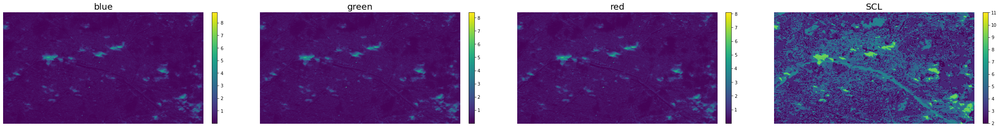

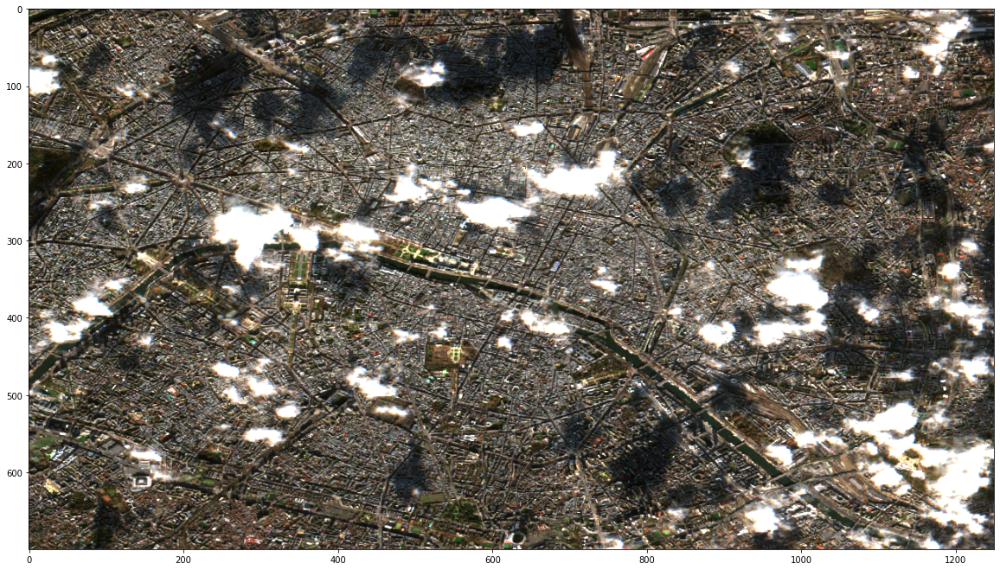

In [ ]:
# Get RGB composites for the Sentinel-2 image
S2_img_rgb = get_rgb_from_s2(
    r=S2_img.red.values,
    g=S2_img.green.values,
    b=S2_img.blue.values,
)

# Visualize each R, G, B, and SCL band
num_rows = 1
num_cols = len(list(S2_img.keys()))

fig = plt.figure(figsize = (40, 10))
for i, data_name in enumerate(list(S2_img.keys())):
  ax = fig.add_subplot(num_rows, num_cols, i+1)
  im = ax.imshow(np.squeeze(S2_img[data_name]))
  plt.colorbar(im, fraction=0.026, pad=0.04)
  ax.set_title(data_name, fontsize = 20)
  ax.axis('off')

# Visualize the RGB composite of Sentinel-2
plt.figure(figsize = (20, 20))
plt.imshow(S2_img_rgb);

We now extract the Polygon from the image to use for the methodology section.
We do this by extracting the geospatial bounds of a single band, creating a shapely box geometry from it and then utilising the shapely box to create a geopandas dataframe.

In [ ]:
# get bounds and create shapely polygon
img_poly = shapely.geometry.box(*S2_img.red.rio.bounds())

# create gedf from bounds
img_gdf = gpd.GeoDataFrame(index=[0], crs="EPSG:4326", geometry=[img_poly])

## 6.3 European Urban Atlas (EUA)

[The European Urban Atlas](https://land.copernicus.eu/local/urban-atlas/urban-atlas-2018) provides reliable, inter-comparable, high-resolution land use and land cover data for 785 Functional Urban Area (FUA) with more than 50,000 inhabitants for the 2018 reference year in EEA38 countries (EU, EFTA, Western Balkans countries, as well as Turkey) and the United Kingdom. The spatial data can be downloaded together with a map for each FUA covered and a report with the metadata for the respective area.

Urban Atlas is a joint initiative of the European Commission Directorate-General for Regional and Urban Policy and the Directorate-General for Defence Industry and Space in the frame of the EU Copernicus programme, with the support of the European Space Agency and the European Environment Agency.

EUA files can be downloaded for individual cities in Europe.
<!--
ref = https://geo.data.gouv.fr/en/datasets/dadc413cafdc33bf301c5685c14e5784a2f74b0d -->

In [ ]:
gdown_quiet = True
EUA_save_path = "EUA_paris.gpkg"
gdrive_path =  "https://drive.google.com/file/d/1cegs-eHwZgRiOMxR3fiRKaj5oI3VDNnx/view?usp=sharing"
gdown.download(
    gdrive_path,
    EUA_save_path,
    quiet=gdown_quiet,
    fuzzy=True
);

The EUA is available in the form of a geopackage. We can load this geopackage using **GeoPandas**. Geopackages help us in storing multiple geometries along with metadata information such as the class of each geometry.

Do note that the CRS of the EUA is different from that of our S2 image, so we reproject it to match the S2 image ("EPSG:4326"). It is essential to have all of the data in the same CRS before doing any computation on them to find intersects, overlaps etc. If not, many functions will not work properly.

In [ ]:
# read gpkg using geopandas
EUA_gdf = gpd.read_file(EUA_save_path)
EUA_gdf = EUA_gdf.to_crs("EPSG:4326")

# rename class_2018 to say class
EUA_gdf = EUA_gdf.rename(columns={"class_2018":"class"})

#
print(f"Data dimensions: {EUA_gdf.shape}")
EUA_gdf.head(3)

Data dimensions: (156314, 12)


,country,fua_name,fua_code,code_2018,class,prod_date,identifier,perimeter,area,comment,Pop2018,geometry
0,FR,Paris,FR001L1,11220,Discontinuous medium density urban fabric (S.L...,2020-09,60594-FR001L1,3239.214688,69512.517102,None,243,"MULTIPOLYGON (((2.46079 48.65060, 2.46079 48.6..."
1,FR,Paris,FR001L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,24152-FR001L1,2641.619752,57086.699476,None,240,"MULTIPOLYGON (((2.18463 48.49043, 2.18463 48.4..."
2,FR,Paris,FR001L1,11210,Discontinuous dense urban fabric (S.L. : 50% -...,2020-09,25074-FR001L1,289.534770,4142.126532,None,25,"MULTIPOLYGON (((2.29310 48.56009, 2.29257 48.5..."


We can see that the geopackage contains **156314** polygons and **12** columns of data. For this tutorial, not all of these columns are relevant for us. We will just be using the class and geometry columns, so we can go ahead and drop the rest of the columns.

In [ ]:
EUA_gdf = EUA_gdf[['class', 'geometry']]
EUA_gdf.head()

,class,geometry
0,Discontinuous medium density urban fabric (S.L...,"MULTIPOLYGON (((2.46079 48.65060, 2.46079 48.6..."
1,Discontinuous dense urban fabric (S.L. : 50% -...,"MULTIPOLYGON (((2.18463 48.49043, 2.18463 48.4..."
2,Discontinuous dense urban fabric (S.L. : 50% -...,"MULTIPOLYGON (((2.29310 48.56009, 2.29257 48.5..."
3,Discontinuous dense urban fabric (S.L. : 50% -...,"MULTIPOLYGON (((2.26731 48.59829, 2.26731 48.5..."
4,Continuous urban fabric (S.L. : > 80%),"MULTIPOLYGON (((2.59037 48.62076, 2.59032 48.6..."


The description of all the classes is provided in the [EUA manual](https://land.copernicus.eu/user-corner/technical-library/urban-atlas-mapping-guide) from page 12 onwards

In [ ]:
print ('Number of unique classes:', len(EUA_gdf['class'].unique()))
pprint.pprint(list(EUA_gdf['class'].unique()))

Number of unique classes: 26
['Discontinuous medium density urban fabric (S.L. : 30% - 50%)',
 'Discontinuous dense urban fabric (S.L. : 50% -  80%)',
 'Continuous urban fabric (S.L. : > 80%)',
 'Industrial, commercial, public, military and private units',
 'Discontinuous low density urban fabric (S.L. : 10% - 30%)',
 'Green urban areas',
 'Forests',
 'Isolated structures',
 'Port areas',
 'Discontinuous very low density urban fabric (S.L. : < 10%)',
 'Fast transit roads and associated land',
 'Other roads and associated land',
 'Railways and associated land',
 'Arable land (annual crops)',
 'Airports',
 'Mineral extraction and dump sites',
 'Land without current use',
 'Sports and leisure facilities',
 'Permanent crops (vineyards, fruit trees, olive groves)',
 'Pastures',
 'Water',
 'Construction sites',
 'Herbaceous vegetation associations (natural grassland, moors...)',
 'Open spaces with little or no vegetation (beaches, dunes, bare rocks, '
 'glaciers)',
 'Complex and mixed cultiv

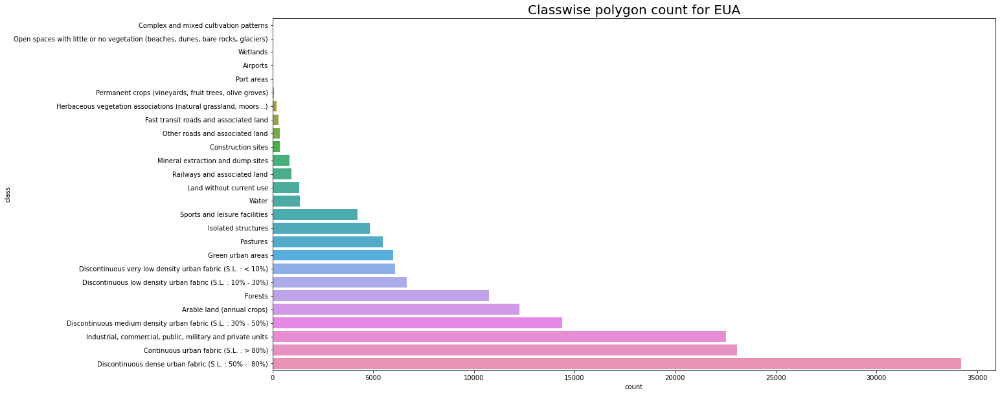

In [ ]:
plt.figure(figsize=(20, 10))
sns.countplot(
    y='class',
    data=EUA_gdf,
    order=EUA_gdf['class'].value_counts().index[::-1]
)
plt.title('Classwise polygon count for EUA', fontsize=20);

On plotting the value count of the polygon classes, we see that Urban areas seem to dominate the land use classes, which makes sense since the data is from Paris.

Next, let's now visualise the whole geopackage using geopandas and matplotlib. We will define a function to plot a geopackage along with a single polygon geodataframe. This function will be useful later to visualise steps in the methodology section.  

In [ ]:
def plot_EUA_and_gdf(gpkg, gdf, title = ''):
  # get the number of unique colours
  # equal to the number of classes in the dataset
  colors = distinctipy.get_colors(
      len(gpkg['class'].unique()),
      rng=42,
      n_attempts=10000
  )

  # get colourmap for these classes
  cmap = distinctipy.get_colormap(colors)

  # plot the geopackage
  ax = gpkg.plot(
      figsize=(20, 20),
      column='class',
      legend=True,
      legend_kwds={'bbox_to_anchor': (1.6, 1), 'fontsize' : 15},
      cmap=cmap
  )

  # plot the geodataframe
  gdf.boundary.plot(color='k', ax=ax, label='AOI', lw=8)
  ax.axis('off');

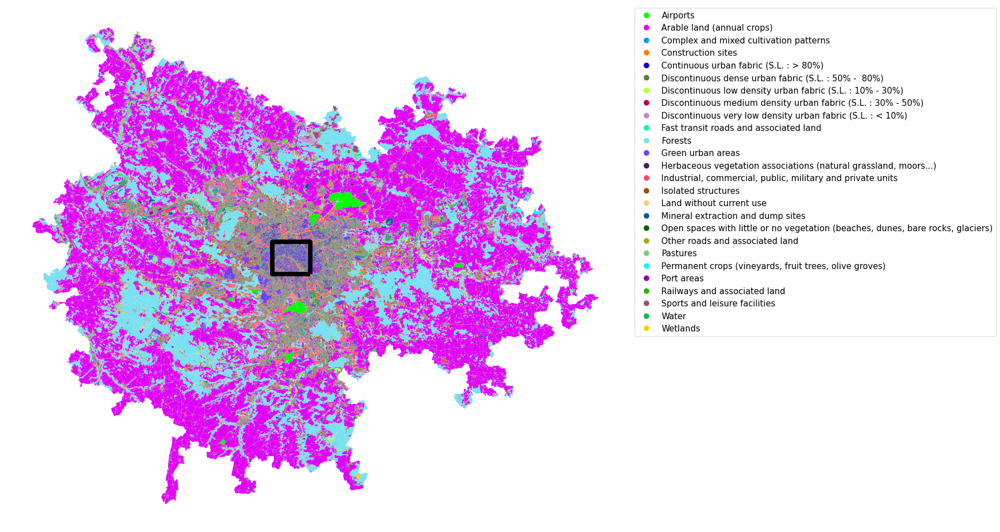

In [ ]:
plot_EUA_and_gdf(EUA_gdf, img_gdf)

<a name="methodology"></a>

---
# 7. Dataset Creation Methodology
---

* In this section we provide a step by step guide on how to turn satellite image and vector data into an ML-ready dataset for training a semantic segmentation model.

* In our case we are using the Sentinel-2 satellite imagery and EUA vector land use data, but this pipeline is meant to be generalizable and customizable for any satellite image data and vector dataset.

* Shown below is a flowchart of the overview of the whole pipeline.

* In addition to dataset creation we also use the generated dataset to prototype a semantic segmentation model.

<br>
<img src='https://drive.google.com/uc?id=1ULq_TVG4BJk2SRJgmg385jHcGiknTw2Y'>

## 7.1 Find intersections between the geopackage and the geojsons
The goal of this section is to find the polygons which lie inside the bounds of our Sentinel-2 image.

### 7.1.1 Find overlapping polygons

The first step to find which polygons overlap with our S2 image. We do this by iterating through the geopandas dataframe and then using the ```.intersects()``` method.  

In [ ]:
def find_overlapping_polygons(query_polygon, polygons_gdf):
    intersect_idx = []

    # iterate through rows of dataframe
    # and get the overlapping polygons
    for i, row in tqdm.tqdm(
        polygons_gdf.iterrows(),
        total=len(polygons_gdf)
    ):
        poly = row["geometry"]
        intersect_idx.append(
            poly.intersects(query_polygon)
        )

    return intersect_idx

After finding the polygons overlapping with the S2 image, we can drop the polygons which have no overlap.

In [ ]:
EUA_gdf['intersecting'] = find_overlapping_polygons(
    query_polygon=img_gdf['geometry'][0],
    polygons_gdf=EUA_gdf
)
print ("\nNumber of polygons overlapping with the AOI: {} out of {}".format(
    EUA_gdf['intersecting'].sum(),
    len(EUA_gdf)
))
EUA_gdf = EUA_gdf[EUA_gdf['intersecting']]

100%|██████████| 156314/156314 [00:09<00:00, 16797.82it/s]



Number of polygons overlapping with the AOI: 7570 out of 156314


We see that the number of polygons we are left with drastically decreases. We are only left with 8003 polygons now. This step helps us significantly decrease the number of polygons we have to process in the next steps.

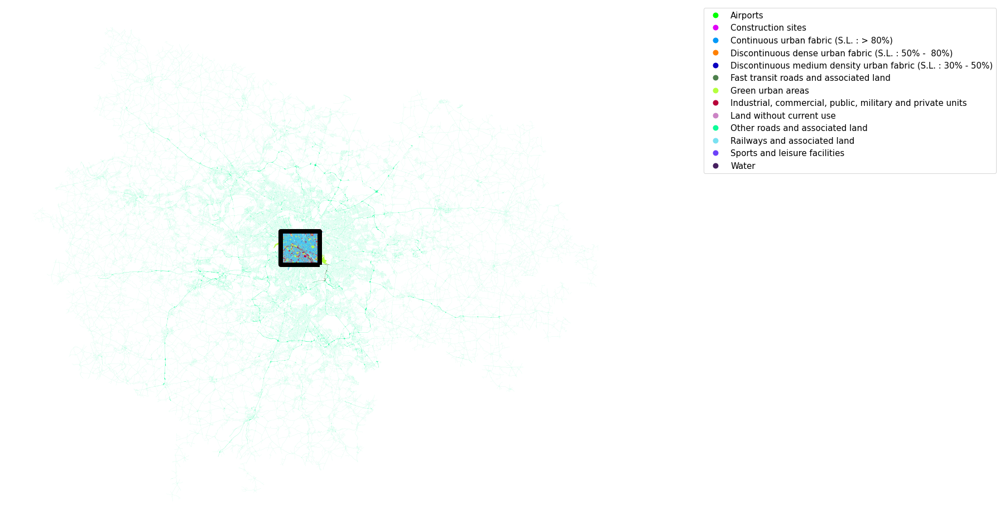

In [ ]:
plot_EUA_and_gdf(EUA_gdf, img_gdf)

We see that we have significantly reduced the number of polygons. Notice the green road network as well as some other polygons outside the black AOI boundary, we need to get rid of these. Let's see how to deal with this in the next step.

### 7.1.2 Find intersecting polygons

Now that we have overlapping polygons, we want to try and isolate the areas which directly intersect with our Sentinel-2 image. We can do this by finding the intersection between the Sentinel-2 polygon and polygons in the GeoDataFrame. This is done using the ```.intersection()``` method.

You might be wondering, why not find intersecting with the polygons directly instead of finding overlaps and discarding polygons? This is because ```.intersection()``` is a more time consuming method as it has to calculate the overlapping geometry, whereas ```.intersects()``` only has to to check for overlap and takes significantly less time. This method is simply faster as compared to directly finding intersections.

In [ ]:
def find_intersections_with_query(query_polygon, polygons_gdf):
    intersecting_polygons_list = []
    class_list = []

    # iterate through overalapping polygons and find
    # the exact intersection with AOI polygon
    for i, row in tqdm.tqdm(polygons_gdf.iterrows(), total=len(polygons_gdf)):
        class_name = row["class"]

        intersecting_poly = row["geometry"].intersection(query_polygon)
        intersecting_polygons_list.append(intersecting_poly)
        class_list.append(class_name)

    # create new gdf with only intersecting polygons
    intersecting_gdf = gpd.GeoDataFrame({
        "geometry": intersecting_polygons_list
    }, crs="EPSG:4326")
    intersecting_gdf["class"] = class_list

    return intersecting_gdf

In [ ]:
intersecting_EUA_gdf = find_intersections_with_query(img_gdf['geometry'][0], EUA_gdf)

100%|██████████| 7570/7570 [00:01<00:00, 4359.89it/s]


We can now plot the geodataframe containing only the intersecting polygons

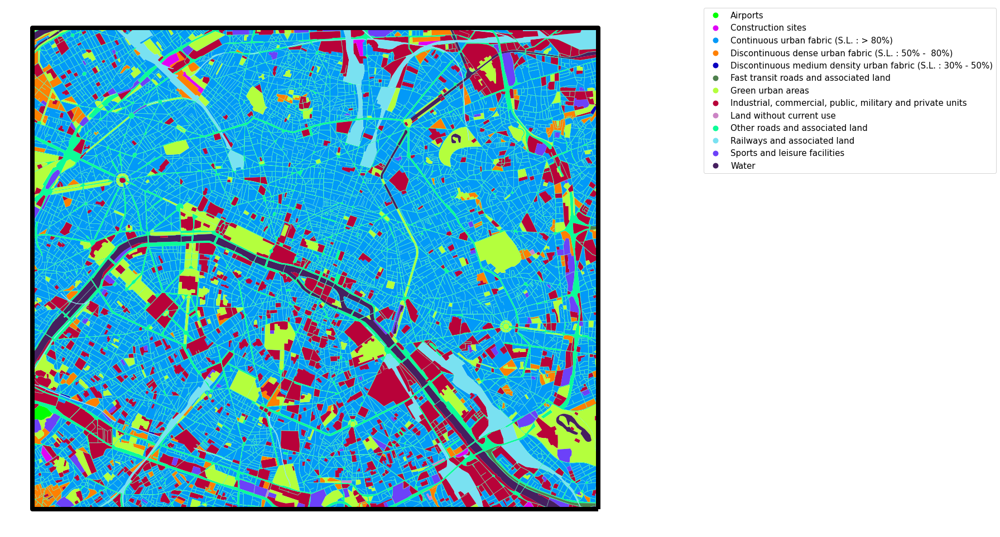

In [ ]:
plot_EUA_and_gdf(intersecting_EUA_gdf, img_gdf)

We see that all of the polygons lie inside the S2 image AOI at this point. Remember this data is still in the form of vector data, to train a ML model, we need to rasterize our data and create a segmentation mask.

## 7.2 Create segmentation mask

The process of converting vector data to rasters is called rasterisation.

One thing to note is that all of the plots we have seen for the polygons have rasterized the polygons to an arbritrary spatial resolution, we want our segmentation mask to have the same spatial resolution and coordinates as our S2 image.

So lets see how we can rasterize the intersecting polygons to create the segmentation mask.

We create mapping dictionaries using the classes in the geodataframe. This key value for each class will be used to represent pixels belonging to it in the segmentation mask.

In [ ]:
class_names = list(intersecting_EUA_gdf['class'].unique())
class_names.sort()

num2class = {x : y for (x, y) in enumerate(class_names, 1)}
class2num = {value : key for key, value in num2class.items()}
num2class

{1: 'Airports',
 2: 'Construction sites',
 3: 'Continuous urban fabric (S.L. : > 80%)',
 4: 'Discontinuous dense urban fabric (S.L. : 50% -  80%)',
 5: 'Discontinuous medium density urban fabric (S.L. : 30% - 50%)',
 6: 'Fast transit roads and associated land',
 7: 'Green urban areas',
 8: 'Industrial, commercial, public, military and private units',
 9: 'Land without current use',
 10: 'Other roads and associated land',
 11: 'Railways and associated land',
 12: 'Sports and leisure facilities',
 13: 'Water'}

Using the ```dissolve()``` method in geopandas, we can combine all of the polygons of a class into a single polygon. This helps in reducing the number of iterations we have to go through when creating the segmentation mask.

Do note that the dissolve step can be very time consuming if done on large geopackages, it would be inefficient to perform this on our original EUA geodataframe.

In [ ]:
dissolved_gdf = intersecting_EUA_gdf.dissolve(by='class')
dissolved_gdf['class'] = dissolved_gdf.index
dissolved_gdf.index = list(range(len(dissolved_gdf)))
dissolved_gdf

,geometry,class
0,"POLYGON ((2.27167 48.83391, 2.27235 48.83426, ...",Airports
1,"MULTIPOLYGON (((2.40008 48.81677, 2.40008 48.8...",Construction sites
2,"MULTIPOLYGON (((2.27191 48.81679, 2.27212 48.8...",Continuous urban fabric (S.L. : > 80%)
3,"MULTIPOLYGON (((2.27293 48.81673, 2.27296 48.8...",Discontinuous dense urban fabric (S.L. : 50% -...
4,"MULTIPOLYGON (((2.30331 48.82963, 2.30188 48.8...",Discontinuous medium density urban fabric (S.L...
5,"MULTIPOLYGON (((2.41576 48.81772, 2.41612 48.8...",Fast transit roads and associated land
6,"MULTIPOLYGON (((2.28268 48.81748, 2.28265 48.8...",Green urban areas
7,"MULTIPOLYGON (((2.28252 48.81673, 2.28252 48.8...","Industrial, commercial, public, military and p..."
8,"MULTIPOLYGON (((2.37490 48.81927, 2.37537 48.8...",Land without current use
9,"MULTIPOLYGON (((2.27917 48.81673, 2.27918 48.8...",Other roads and associated land


We see that we have only one geometry per class now. We now create an array of NaN data with the same geospatial coordinates as our S2 image.

We then use the ```clip()``` method to create a segmentation mask for each polygon and then update our segmentation mask. Usually the ```clip``` method is used to clip an image to an AOI, but here we are using it in a hacky way to rasterize the area's corresponding to our segmentation mask.

To understand how it is being used, we need to understand the ```drop``` parameter of the function.

* ```drop``` when passed as True, will result in the clipped region being removed from the matrix, i.e the shape would reduce to only the clipped area. When we pass it as False, it results in the original image shape being retained and the regions out of the AOI being marked as NaN.

We create an xarray of the same height and width of our S2 image and a single channel. This array contains only 1's, when we clip it using the polygon for each class, all pixels outside the AOI are converted to NaN, and it retains the shape of the array, as we pass ```drop=False```. This helps us rasterize the AOI regions. We then multiply the clipped image with its class value and then add it to the seg_mask.

In [ ]:
# create a segmask with NaN
seg_mask = xr.DataArray(
    np.zeros((S2_img.red.shape[1], S2_img.red.shape[2])) * np.nan,
    dims = ['y', 'x'],
    coords = {'y' : S2_img.y, 'x' : S2_img.x}
)

# create a temp region mask with 1's
temp_region = xr.DataArray(
    np.ones((S2_img.red.shape[1], S2_img.red.shape[2])),
    dims = ['y', 'x'],
    coords = {'y' : S2_img.y, 'x' : S2_img.x}
)

# write the CRS for both the seg_mask and the temp_region mask
# this is required for the clipping function to work
seg_mask = seg_mask.rio.write_crs(4326)
temp_region = temp_region.rio.write_crs(4326)

for i, row in tqdm.tqdm(
    dissolved_gdf.iterrows(),
    total=len(dissolved_gdf)
):
    # make all values 1 after prev loop
    temp_region.values = temp_region.values * 0 + 1

    # clip
    clipped = temp_region.rio.clip(
        [row['geometry']],
        intersecting_EUA_gdf.crs,
        drop=False,
    )

    # use np.nansum since our seg_mask consists of NaN values
    class_mask = clipped.values * class2num[row['class']]
    seg_mask.values = np.nansum([seg_mask.values, class_mask], axis = 0)

num2class, int(np.nanmax(seg_mask.values))

100%|██████████| 13/13 [00:02<00:00,  4.40it/s]


({1: 'Airports',
  2: 'Construction sites',
  3: 'Continuous urban fabric (S.L. : > 80%)',
  4: 'Discontinuous dense urban fabric (S.L. : 50% -  80%)',
  5: 'Discontinuous medium density urban fabric (S.L. : 30% - 50%)',
  6: 'Fast transit roads and associated land',
  7: 'Green urban areas',
  8: 'Industrial, commercial, public, military and private units',
  9: 'Land without current use',
  10: 'Other roads and associated land',
  11: 'Railways and associated land',
  12: 'Sports and leisure facilities',
  13: 'Water'},
 13)

Below we plot the rasterized segmentation mask for the whole S2 image along with all the classes that exist for it, we then also check if its shape matches that of the S2 image.

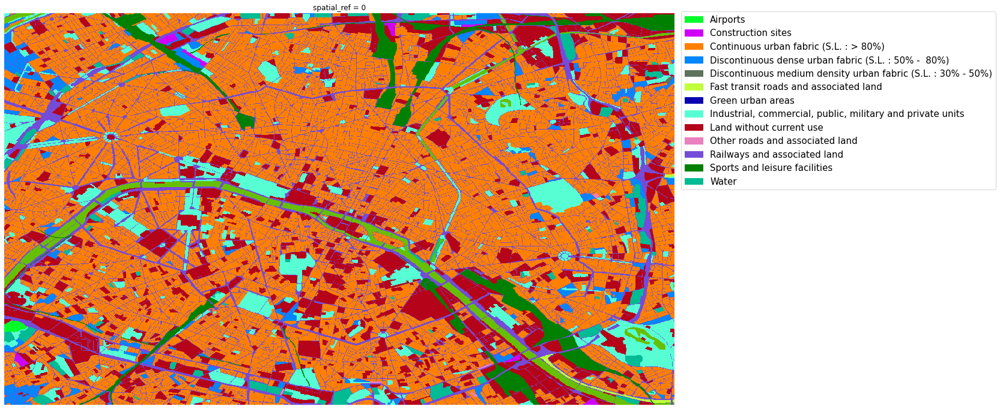

In [ ]:
num_classes = int(np.max(seg_mask.values)) + 1
colors = distinctipy.get_colors(num_classes, rng = 100, n_attempts = 10000)
cmap = distinctipy.get_colormap(colors)

patch_list = []
for c, v in zip(colors, list(num2class.values())):
  data_key = mpatches.Patch(color=c, label=v)
  patch_list.append(data_key)

im = seg_mask.plot(cmap = cmap, figsize = (20, 12), add_colorbar = False)
plt.legend(handles=patch_list, fontsize = 15, loc = (1.01, 0.55))
plt.axis('off');

We have successfully created a rasterised version of our geodataframe. Lets check to see if the shape of our segmentation mask and a S2 band is the same.

In [ ]:
print (S2_img['red'].shape, seg_mask.shape)

(1, 700, 1250) (700, 1250)


We now have an S2 image and segmentation mask, both of the shape (730, 1282) in H and W dimensions. For using this data to train a model, we first need to divide it into smaller pacthes.

## 7.3 Create N x N patches of data

We first create a xarray of a stack of ```[red, green, blue, SCL, seg_mask]``` with the same geospatial coordinates as our S2 image. The purpose of this is to preserve the geocoordinates for each individual patch of data.

In [ ]:
# create data stack
data_stack = np.dstack([
    np.squeeze(S2_img.red.values),
    np.squeeze(S2_img.green.values),
    np.squeeze(S2_img.blue.values),
    np.squeeze(S2_img.SCL.values),
    np.squeeze(seg_mask)
])

# create xarray from stacked data
# using coordinates from the original S2 image
data_stack_xr = xr.DataArray(
    data_stack,
    dims=['y', 'x', 'bands'],
    coords={
        'y' : S2_img.y,
        'x' : S2_img.x,
        'bands': list(range(data_stack.shape[2]))
    }
)

We now define a function to create ```N x N``` patches from the image. The function adds padding if the height and width of the data stack isn't exactly divisible by the patch size

In [ ]:
def create_splits(img, input_shape, pad_mode="reflect"):
    # A function to create splits out of a particular size from a given image.
    # images are split up row wise, i.e - row1 split up, row2 split up and so on
    # NOTE - padding is added in case the image can't be split into equal parts
    #       padding is added on the right and the bottom of the image, padding type
    #       is reflected by default
    splits = []

    # calculate pad length
    pad_len_y = (0 - img.shape[0]) % input_shape[0]
    pad_len_x = (0 - img.shape[1]) % input_shape[1]

    # option to pad the xarray
    if isinstance(img, xr.DataArray):
        img = img.pad(pad_width={
            "y": (0, pad_len_y),
            "x": (0, pad_len_x)},
            mode=pad_mode
        )

    # option to pad normal numpy array
    else:
        img = np.pad(
            img,
            [(0, pad_len_y), (0, pad_len_x), (0, 0)],
            pad_mode
        )

    # loop through the indices with a step of input_shape
    # and create spltis for each index
    for i in range(0, img.shape[0], input_shape[0]):
        for j in range(0, img.shape[1], input_shape[1]):
          # use array slicing to select split size from the whole image
          splits.append(img[i : i + input_shape[0], j : j + input_shape[1]].copy())

    return splits, img

Using the function above, lets generate the ```N x N``` patches, the N value can be modified by the user for running the pipeline differently from here on out.

In [ ]:
N = 64 #@param {type:"number"}
splits, padded_img = create_splits(data_stack_xr, [N, N])
num_splits = len(splits)
print (f"number of splits created of size ({N} X {N}): {len(splits)}")

number of splits created of size (64 X 64): 220


Lets now visualise a single split from the dataset. Do note that we still have to convert the values to RGB range for plotting, since the splits contain raw S2 values.

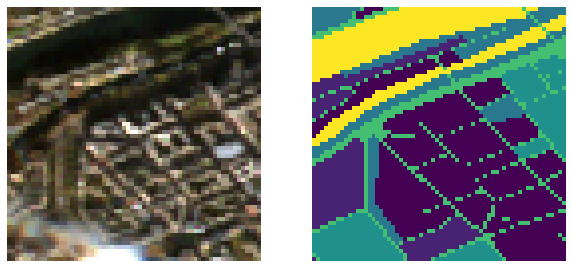

In [ ]:
sample_split = splits[0]
sample = get_rgb_from_s2(
    r=sample_split[:, :, 0],
    g=sample_split[:, :, 1],
    b=sample_split[:, :, 2],
)


fig = plt.figure(figsize = (10, 10))

ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(sample)
ax1.axis('off');

ax2 = fig.add_subplot(1, 2, 2)
ax2.imshow(sample_split[:, :, 4])
ax2.axis('off');

The next step after creating the patches is to check the data quality of each individual patch.

## 7.4 Check for data quality and discard invalid data

Data quality checks are done for each individual patch to discard patches that aren't appropriate for training our ML model. We will also create a dataframe `info_df` to track the information for each patch, the identifier for each patch will be the index number in the ```splits``` list.

In [ ]:
# empty dataframe to track the information for each patch
info_df = pd.DataFrame({'index' : list(range(len(splits)))})

Let's go ahead and define the functions for checking for cloud cover.

### 7.4.1 Defining the checks

Cloud cover poses a big problem when working with S2 data. Clouds block the actual AOI and thus make the image unusable for land use segmentation. Using the values in the ```SCL``` band, we check for cloud shadows and clouds. The SCL band isn't always accurate and there are cases where it provides faulty information.

In [ ]:
def cloud_cover_check(ds_array):
    # Check for cloudy data in SCL band
    ds_array = np.squeeze(ds_array)

    masked = np.zeros((ds_array.shape[0], ds_array.shape[1]))
    masked[ds_array == 3] = 1
    masked[(ds_array >= 8)] = 1
    percent_valid = (1 - sum(sum(masked)) / (ds_array.shape[0] * ds_array.shape[1])) * 100

    return percent_valid

We can't input ```NaN``` data into a ML model, so we need to remove images that have NaN values.

Using the ```np.isnan()``` function, we can check for NaN data. One alternative to removing images is doing data imputation, but we aren't tackling that topic in our current discussion.

In [ ]:
def nan_perc_check(ds_array):
    # Check for NaN data using the SCL band for S2
    ds_array = np.squeeze(ds_array)
    num_nan = np.isnan(ds_array).astype(int).sum()

    return (num_nan / (ds_array.shape[0] * ds_array.shape[1])) * 100

We also check for ```NO_DATA``` pixels using the SCL to remove these, as these are inducing errors into our training dataset.  

In [ ]:
def no_data_check(ds_array):
    # Check for which data is valid using SCL band for S2
    ds_array = np.squeeze(ds_array)
    valid = (ds_array != 0).astype(int)
    percent_valid = (np.sum(valid) / (ds_array.shape[0] * ds_array.shape[1])) * 100

    return percent_valid

### 7.4.2 Peforming data checks

After defining our checks for the dataset, we will then apply these to each patch that we have generated. We add all of the data from these checks to our information dataframe, we also add additional data per patch for the number of pixels for each class.

In [ ]:
# lists to store data for each split
cloud_cover_perc = []
valid_data_perc = []

nan_pix_scl_perc = []
nan_pix_red_perc = []
nan_pix_green_perc = []
nan_pix_blue_perc = []

class_value_count_list = []
class_value_count_abs_list = []

# iterate through the splits
# and perform checks
for split in splits:
    # cloud cover and valid % check using SCL band
    non_cloudy_perc = cloud_cover_check(split[:, :, 3])
    valid_perc = no_data_check(split[:, :, 3])

    # NaN % for each band
    nan_pix_scl_perc.append(nan_perc_check(split[:, :, 3]).values)
    nan_pix_red_perc.append(nan_perc_check(split[:, :, 0]).values)
    nan_pix_green_perc.append(nan_perc_check(split[:, :, 1]).values)
    nan_pix_blue_perc.append(nan_perc_check(split[:, :, 2]).values)

    cloud_cover_perc.append(100 - non_cloudy_perc)
    valid_data_perc.append(valid_perc.values)

    # Add class distribution for the split
    # this is done by counting the number
    # of pixels belonging to each class
    # we store the absolute as well as %
    num_pix = split[:, :, 4].shape[0] * split[:, :, 4].shape[1]
    class_value_count = {
        num2class[k] : v / num_pix
        for k, v in Counter(split[:, :, 4].values.flatten()).items()
    }
    class_value_count_list.append(class_value_count)

    class_value_count_abs = {
        num2class[k] : v
        for k, v in Counter(split[:, :, 4].values.flatten()).items()
    }
    class_value_count_abs_list.append(class_value_count_abs)

# create info data frame using
# the metrics we computed per split
info_df['cloud_cover_percentage'] = cloud_cover_perc
info_df['valid_data_percentage'] = valid_data_perc
info_df['nan_perc_SCL'] = nan_pix_scl_perc
info_df['nan_perc_red'] = nan_pix_red_perc
info_df['nan_perc_green'] = nan_pix_green_perc
info_df['nan_perc_blue'] = nan_pix_blue_perc
info_df['class_value_count_abs'] = class_value_count_abs_list
info_df['class_value_count'] = class_value_count_list

info_df.head()

,index,cloud_cover_percentage,valid_data_percentage,nan_perc_SCL,nan_perc_red,nan_perc_green,nan_perc_blue,class_value_count_abs,class_value_count
0,0,8.984375,100.0,0.0,0.0,0.0,0.0,"{'Green urban areas': 515, 'Other roads and as...","{'Green urban areas': 0.125732421875, 'Other r..."
1,1,17.187500,100.0,0.0,0.0,0.0,0.0,"{'Green urban areas': 188, 'Water': 30, 'Other...","{'Green urban areas': 0.0458984375, 'Water': 0..."
2,2,4.101562,100.0,0.0,0.0,0.0,0.0,"{'Industrial, commercial, public, military and...","{'Industrial, commercial, public, military and..."
3,3,21.289062,100.0,0.0,0.0,0.0,0.0,"{'Green urban areas': 225, 'Industrial, commer...","{'Green urban areas': 0.054931640625, 'Industr..."
4,4,40.722656,100.0,0.0,0.0,0.0,0.0,{'Continuous urban fabric (S.L. : > 80%)': 179...,{'Continuous urban fabric (S.L. : > 80%)': 0.4...


We now have a dataframe containing the information for each patch, which we can use this to filter the data we want. Before moving on to that step, let's visualise some of the patches along with the SCL band and the segmentation mask generated using the European Urban Atlas.

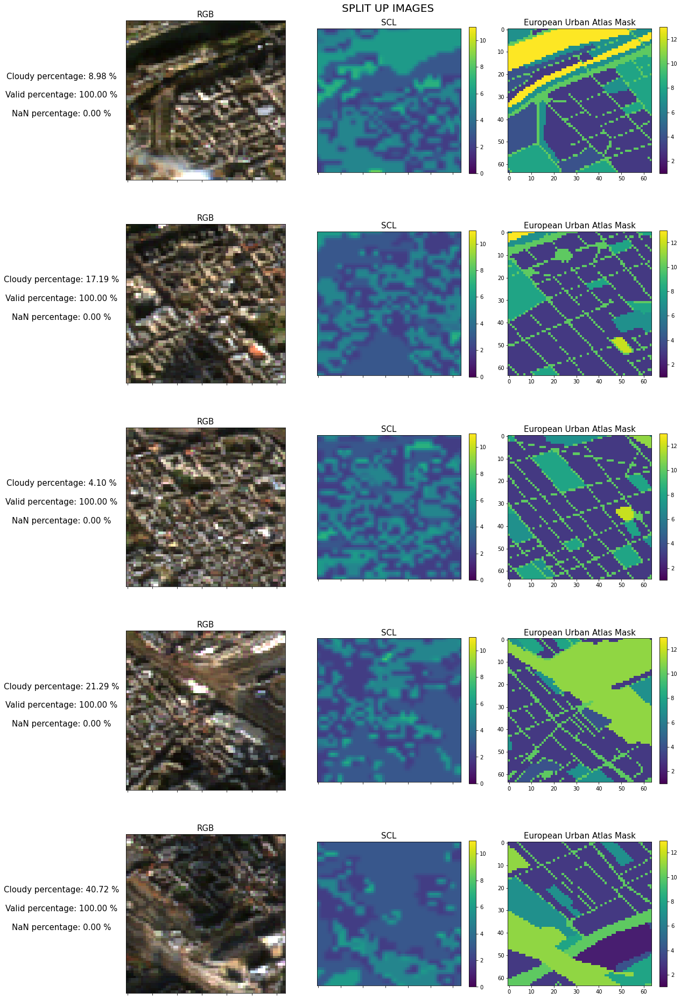

In [ ]:
num_rows = min(len(info_df), 5)
num_cols = 3

fig = plt.figure(figsize = (num_cols * 6, num_rows * 6))
j = 1

# got through the info df and display some images
for i, row in info_df[:num_rows].iterrows():
    s = splits[int(row['index'])]

    # plot the rgb image
    ax = fig.add_subplot(num_rows, num_cols, j)
    ax.imshow(get_rgb_from_s2(
        r=s[:, :, 0],
        g=s[:, :, 1],
        b=s[:, :, 2],
    ));
    ax.yaxis.set_major_locator(plt.NullLocator())
    ax.xaxis.set_major_formatter(plt.NullFormatter())
    ax.set_title('RGB', fontsize = 15)

    # metadata string for the split
    info_string = f"Cloudy percentage: {row['cloud_cover_percentage'] :.02f} %\n\n"
    info_string += f"Valid percentage: {row['valid_data_percentage'] :.02f} %\n\n"
    info_string += f"NaN percentage: {row['nan_perc_red'] :.02f} %\n\n"
    plt.ylabel(info_string, rotation = 0, fontsize = 15, labelpad = 120, y = 0.27)

    # plot the SCL band
    ax = fig.add_subplot(num_rows, num_cols, j + 1)
    im = ax.imshow(s[:, :, 3], vmax = 11, vmin = 0)
    fig.colorbar(im, fraction=0.046)
    ax.set_title('SCL', fontsize = 15)

    ax.yaxis.set_major_locator(plt.NullLocator())
    ax.xaxis.set_major_formatter(plt.NullFormatter())

    # plot the EUA mask that we created
    ax = fig.add_subplot(num_rows, num_cols, j + 2)
    im = ax.imshow(s[:, :, 4], vmax = max(num2class.keys()), vmin = min(num2class.keys()))
    fig.colorbar(im, fraction=0.046)
    ax.set_title('European Urban Atlas Mask', fontsize = 15)

    j = j + num_cols

plt.suptitle('SPLIT UP IMAGES', fontsize = 20)
fig.subplots_adjust(top=0.97)

### 7.4.3 Drop invalid data

We can now drop the invalid data according to conditions for ```NaN %``` and cloud cover. These conditions are to be set by the user according to their use case.  

In [ ]:
cloud_cover_limit = 10 #@param{type:"number"}
RGB_nan_limit = 0 #@param{type:"number"}

filtered_info_df = info_df[info_df['cloud_cover_percentage'] <= cloud_cover_limit]
filtered_info_df = filtered_info_df[filtered_info_df['nan_perc_red'] <= RGB_nan_limit]

print (f'Number of images dropped = {len(info_df) - len(filtered_info_df)} out of {len(info_df)}')

Number of images dropped = 112 out of 220


Let's visualise the images that were dropped and the images that weren't. The below code draws grid lines on the original S2 image for the size ```N x N``` and then fills it with a mask indicating if the patch was dropped or not.

In [ ]:

def draw_grid(img, grid_shape, color=(0, 255, 0), thickness=1):
    # function to draw a grid of
    # N x N shape on an image
    h, w, _ = img.shape
    rows, cols = grid_shape
    dy, dx = h / rows, w / cols

    # draw vertical lines
    for x in np.linspace(start=dx, stop=w-dx, num=cols-1):
        x = int(round(x))
        cv2.line(img, (x, 0), (x, h), color=color, thickness=thickness)

    # draw horizontal lines
    for y in np.linspace(start=dy, stop=h-dy, num=rows-1):
        y = int(round(y))
        cv2.line(img, (0, y), (w, y), color=color, thickness=thickness)

    return img

def get_filled_splits(img, info_df, drop_color, pick_color):
  # function to color patches according
  # to if they are valid or not
  splits, _ = create_splits(img, input_shape = [N, N])
  splits_new = []
  valid_idxs = list(info_df['index'])

  # iterate through splits and color them
  # based on if they are valid or not
  for i, split in enumerate(splits):
    if i in valid_idxs:
      mask = np.full_like(split, [pick_color], np.uint8)
      splits_new.append(cv2.addWeighted(split, 0.8, mask, 0.2,0))
    else:
      mask = np.full_like(split, [drop_color], np.uint8)
      splits_new.append(cv2.addWeighted(split, 0.8, mask, 0.2,0))

  return splits_new

def stitch(split_images, input_shape, orig_shape):
    # stitch smaller image splits together to form
    # the larger image they were created from
    border_len_y = (0 - orig_shape[0]) % input_shape[0]
    border_len_x = (0 - orig_shape[1]) % input_shape[1]

    # create image of 0's
    # which is equivalent to the shape of the
    # original image + padding done while splitting
    img_stitched = np.zeros((
        orig_shape[0] + border_len_y,
        orig_shape[1] + border_len_x, orig_shape[2]
    ))
    k = 0

    # iterate through the idxs and
    # place  splits acc. to index
    for i in range(0, img_stitched.shape[0], input_shape[0]):
        for j in range(0, img_stitched.shape[1], input_shape[1]):
            img_stitched[i : i + input_shape[0], j : j + input_shape[1]] = split_images[k]
            k = k + 1

    # remove padded area from the image
    img_stitched = img_stitched[0 : orig_shape[0], 0 : orig_shape[1]]

    return img_stitched

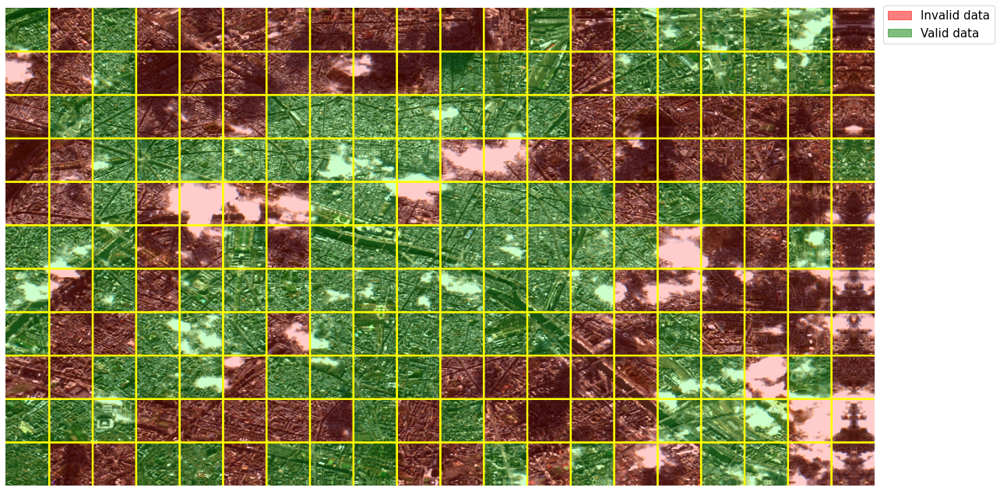

In [ ]:
# image to display for the plot
disp_img = get_rgb_from_s2(
    r=padded_img.values[:, :, 0],
    g=padded_img.values[:, :, 1],
    b=padded_img.values[:, :, 2],
)

# cast all nan valyes to 0
disp_img = np.nan_to_num(disp_img, 0)
disp_img = (disp_img * 255).astype('uint8')

# get colored splits
colored_splits = get_filled_splits(
    disp_img,
    filtered_info_df,
    drop_color=[255, 0, 0],
    pick_color=[0, 255, 0]
)

# create full image from colored splits
disp_img = stitch(
    colored_splits,
    input_shape=[N, N],
    orig_shape=disp_img.shape
).astype('uint8')

plt.figure(figsize = (20, 20))

# draw grids on colored image
plt.imshow(draw_grid(
    disp_img.copy(),
    grid_shape=[disp_img.shape[0] // N, disp_img.shape[1] // N],
    color=[255, 255, 0],
    thickness=2
))

plt.axis('off')
red_patch = mpatches.Patch(color='red', label='Invalid data', alpha = 0.5)
green_patch = mpatches.Patch(color='green', label='Valid data', alpha = 0.5)
plt.legend(handles=[red_patch, green_patch], fontsize = 15, loc = (1.01, 0.925))
plt.axis('off');

- We can see that there are some cloudy tiles, which is due to the accuracy of the SCL band from S2.

## 7.5 Save data as Multispectral (MS) and RGB

Now that we have our resulting patches, we can now save these patches into our land cover segmentation dataset.

In [ ]:
dataset_folder = 'landcover_segmentation_dataset'

### 7.5.1 Save MS dataset

We first save the multispectral images, which we store in the form of NetCDF. These are georeferenced and contain metadata relating to image quality, cloud cover, tile name etc. We'll also be adding the path for each image to our information dataframe.

In [ ]:
# create directory to save the dataset
ms_imgs_folder = os.path.join(dataset_folder, 'ms_imgs')
os.makedirs(ms_imgs_folder, exist_ok=True)

# list to store ms image paths
ms_path_list = []

# iterate through the info df and save image
# corresponding to each row
for i, row in filtered_info_df.iterrows():
  # get save path for the image
  ms_img_name = str(row['index']) + '.nc'
  ms_save_path = os.path.join(ms_imgs_folder, ms_img_name)

  split = splits[i]

  # create an xarray dataarray for each band
  # use coordinates of the split as data coords
  r_xr = xr.DataArray(
      split[:, :, 0],
      dims=['y', 'x'],
      coords={
          'y' : split.y,
          'x' : split.x,
      }
  )

  g_xr = xr.DataArray(
      split[:, :, 1],
      dims=['y', 'x'],
      coords={
          'y' : split.y,
          'x' : split.x,
      }
  )

  b_xr = xr.DataArray(
      split[:, :, 2],
      dims=['y', 'x'],
      coords={
          'y' : split.y,
          'x' : split.x,
      }
  )

  scl_xr = xr.DataArray(
      split[:, :, 3],
      dims=['y', 'x'],
      coords={
          'y' : split.y,
          'x' : split.x,
      }
  )
  mask_xr = xr.DataArray(
      split[:, :, 4],
      dims=['y', 'x'],
      coords = {
          'y' : split.y,
          'x' : split.x
      }
  )

  # create an xarray dataset from a xarray dataarray
  split_dataset = r_xr.to_dataset(name = 'r')

  # add all other data variables to the xarray dataset
  split_dataset['g'] = g_xr
  split_dataset['b'] = b_xr
  split_dataset['scl'] = scl_xr
  split_dataset['land_class_mask'] = mask_xr

  # add metadata to the xarray dataset
  split_dataset.attrs['cloud_cover_percentage'] = row['cloud_cover_percentage']
  split_dataset.attrs['valid_data_percentage'] = row['valid_data_percentage']
  split_dataset.attrs['nan_perc_SCL'] = row['nan_perc_SCL']
  split_dataset.attrs['nan_perc_rgb'] = row['nan_perc_red']
  split_dataset.attrs['tile_name'] = S2_img.attrs['tile_name']

  # save the xarray dataset in netcdf format to disk
  split_dataset.to_netcdf(ms_save_path)
  ms_path_list.append(os.path.sep.join(ms_save_path.split('/')[1:]))

# add saved paths to the info dataframe
filtered_info_df['ms_img_path'] = ms_path_list

### 7.5.2 Save RGB dataset
Now we save the images in True RGB format as PNGs. Do note that we cast NaN to 0 incase the data quality limits allow any NaN data. In addition to this we also add the path for each image to our information dataframe.

In [ ]:
# create folder to save the RGB dataset
rgb_imgs_folder = os.path.join(dataset_folder, 'rgb_imgs')
os.makedirs(rgb_imgs_folder, exist_ok=True)

# list to store rgb image paths
rgb_path_list = []

# iterate through the info df and save image
# corresponding to each row
for i, row in filtered_info_df.iterrows():
    split = splits[i]

    # get rgb image path
    rgb_img_name = str(row['index']) + '.png'
    rgb_save_path = os.path.join(rgb_imgs_folder, rgb_img_name)

    # get true RGB image from raw S2 bands
    rgb_img = get_rgb_from_s2(
        r=split[:, :, 0],
        g=split[:, :, 1],
        b=split[:, :, 2],
    )

    # convert any remaining NaN to 0
    # as we dont want to have NaN data when
    # storing it as a PNG
    rgb_img = np.nan_to_num(rgb_img, 0.)

    # write the image to the save path
    # convert image from RGB to BGR
    # as its the format OpenCV uses for image data
    cv2.imwrite(
        rgb_save_path,
        cv2.cvtColor(
            (rgb_img * 255).astype('uint8'),
            cv2.COLOR_RGB2BGR
        )
    )

    rgb_path_list.append(
        os.path.sep.join(rgb_save_path.split('/')[1:])
    )

# add saved paths to the info dataframe
filtered_info_df['rgb_img_path'] = rgb_path_list

### 7.5.3 Visualise structure of saved dataset

Let's view the structure of the dataset we just saved. We will be saving the information data frame as well, but before we do that we need to create COCO segmentation masks and add the **image ids** from the COCO file to it.

In [ ]:
!tree $dataset_folder --filelimit=5

/bin/bash: tree: command not found


## 7.6 Store segmentation mask in [COCO format](https://cocodataset.org/#home)

We will save the segmentation masks in a COCO JSON file. COCO is simply a format for saving annotations for segmentation, object detection and other tasks.

The reasons for storing masks in a COCO format are:
1. The masks can be saved in a single file.
2. It reduces the storage space we use, since the segmentation masks are encoded and not stored as raw images.
3. Additional information such as information and licenses can be stored in the same file.
4. The category, annotation and image IDs are stored in the JSON itself. This helps in filtering by these options.

To get a clearer understanding of COCO annotations, I would recommend this [blog post](https://www.immersivelimit.com/tutorials/create-coco-annotations-from-scratch)

### 7.6.1 Attribute dict creation functions

The function below is for getting a top level empty COCO dictionary

In [ ]:
def get_coco_dict():
    return {
        "info": {},
        "licenses": [],
        "images": [{}],
        "categories": [{}],
        "annotations": [{}]
    }

The function below is meant for creating the category dict using our class mapping

In [ ]:
def create_category_annotation(category_dict):
    category_list = []

    for key, value in category_dict.items():
        category = {"supercategory": value, "id": key, "name": value}

        category_list.append(category)

    return category_list

The function below is for creating a single image annotation given the params

In [ ]:
def create_image_annotation(file_name, width, height, image_id):
    image = {
        "file_name": file_name,
        "height": height,
        "width": width,
        "id": image_id
    }
    return image

### 7.6.2 Generation of mask annotations

Let's see how to generate mask annotations from our already existing segmentation masks.

The masks we have contain multiple classes in the same mask, for storing mask annotations, we need individual masks for each class. The function below is responsible for generating individual masks from a multiclass semantic segmentation mask.

In [ ]:
def generate_sub_masks_from_int_mask(mask):
    # Generate individual from single mask containing multiple classes
    sub_masks_dict = {}

    for unique_val in set(mask.flatten()):
        sub_mask = (mask == unique_val).astype("uint8")
        sub_masks_dict[unique_val] = sub_mask

    return sub_masks_dict

Lets visualise the output of the ```generate_sub_masks_from_int_mask()``` and see the different submasks we get

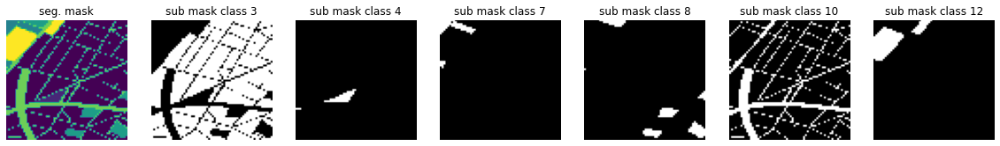

In [ ]:
split_idx = 80
sub_mask_sample_dict = generate_sub_masks_from_int_mask(splits[split_idx][:, :, 4].values)

fig = plt.figure(figsize = (20, 20))
num_rows = 1
num_cols = len(sub_mask_sample_dict) + 1

# plot multiclass seg mask
ax = fig.add_subplot(num_rows, num_cols, 1)
ax.imshow(splits[split_idx][:, :, 4].values)
ax.axis('off')
ax.set_title('seg. mask')

# plot sub masks
for i, key in enumerate(sub_mask_sample_dict.keys(), 2):
  ax = fig.add_subplot(num_rows, num_cols, i)
  mask = sub_mask_sample_dict[key]
  ax.imshow(mask, cmap = 'gray')
  ax.axis('off')
  ax.set_title(f'sub mask class {int(key)}')

To store the masks, we convert them into Run Length Encoded (RLE) strings, this helps us reduce the masks dimensionality and easily store it as a part of the dictionary. (add resource to understand RLE here).

Do note that one other method to generate encodings is by using contour detection and then storing the resulting geometry. We found out that it didn't work very well for our classes due to the complex geometry and shape of the sub masks. This is why we chose to use RLE encoding.

We use the **pycocotools** library to generate the RLE strings from single masks.

In [ ]:
def create_rle_annotation_from_submasks(sub_masks_dict, img_id, annot_id_start=0):
    # Create Run Length Encoding annotations for each submask
    # and put it in a COCO annotation dict
    annotations = []
    annot_id = annot_id_start

    for class_id, mask in sub_masks_dict.items():
        # incase NaN passed through as a class
        # check and remove
        if class_id != class_id:
            continue

        # create rle encoding
        rle = maskutils.encode(np.asarray(mask, order="F"))
        rle["counts"] = rle["counts"].decode("ascii")

        # create segmentation annotation
        annotation = {
            "segmentation": rle,
            "iscrowd": 1,
            "image_id": img_id,
            "category_id": class_id,
            "id": annot_id,
            "bbox": cv2.boundingRect(mask),
        }

        annot_id = annot_id + 1
        annotations.append(annotation)

    return annotations, annot_id

We then create a function which creates the annotations for all of the patches that we have. We also add the COCO ImgIDs to the information dataframe, so that we can easily get the metadata for all images or load up annotations based on the information dataframe

In [ ]:
def create_coco_annotations(info_df, splits, label_mapping_dict):
    # initialize empty COCO dict
    coco_dict = get_coco_dict()

    # create category annotations using label_mapping dict
    coco_dict["categories"] = create_category_annotation(label_mapping_dict)

    img_id_counter = 0
    annot_id_counter = 0

    img_annotations = []
    mask_annotations = []
    img_id_list = []

    # iterate through info_df and create annotations for each img row
    for i, row in tqdm.tqdm(info_df.iterrows(), total=len(info_df)):
        file_name = row['rgb_img_path']
        mask = splits[row["index"]][:, :, 4].values

        # create img annotations
        img_annot = create_image_annotation(
            file_name=file_name,
            height=mask.shape[0],
            width=mask.shape[1],
            image_id=img_id_counter
        )

        # get sub masks
        sub_masks_dict = generate_sub_masks_from_int_mask(mask=mask)

        # create mask annotations
        mask_annots, num_annots_created = create_rle_annotation_from_submasks(
            sub_masks_dict=sub_masks_dict,
            annot_id_start=annot_id_counter,
            img_id=img_id_counter
        )

        # store annotations and update counters
        img_id_list.append(img_id_counter)
        img_annotations.append(img_annot)
        mask_annotations.extend(mask_annots)

        annot_id_counter = num_annots_created
        img_id_counter = img_id_counter + 1

    # add all annotations to base coco dict
    coco_dict["images"] = img_annotations
    coco_dict["annotations"] = mask_annotations

    return coco_dict, img_id_list

In [ ]:
coco_json, img_id_list = create_coco_annotations(filtered_info_df, splits, num2class)
# add coco img_ids to the info df
filtered_info_df['img_id_coco'] = img_id_list
filtered_info_df.head(3)

100%|██████████| 108/108 [00:00<00:00, 1251.28it/s]


,index,cloud_cover_percentage,valid_data_percentage,nan_perc_SCL,nan_perc_red,nan_perc_green,nan_perc_blue,class_value_count_abs,class_value_count,ms_img_path,rgb_img_path,img_id_coco
0,0,8.984375,100.0,0.0,0.0,0.0,0.0,"{'Green urban areas': 515, 'Other roads and as...","{'Green urban areas': 0.125732421875, 'Other r...",ms_imgs/0.nc,rgb_imgs/0.png,0
2,2,4.101562,100.0,0.0,0.0,0.0,0.0,"{'Industrial, commercial, public, military and...","{'Industrial, commercial, public, military and...",ms_imgs/2.nc,rgb_imgs/2.png,1
12,12,7.128906,100.0,0.0,0.0,0.0,0.0,"{'Sports and leisure facilities': 284, 'Green ...",{'Sports and leisure facilities': 0.0693359375...,ms_imgs/12.nc,rgb_imgs/12.png,2


Unfortunately the ```IPython.display.JSON()``` functions isn't working properly in google colab, you can instead view the COCO JSON in an interactive format [here](http://json-parser.com/0c39243b)

## 7.6.3 Saving COCO JSON and Information DataFrame

In [ ]:
info_df_save_path = os.path.join(dataset_folder, 'info_df.pkl')
coco_save_path = os.path.join(dataset_folder, 'coco_annotations.json')
filtered_info_df.to_pickle(info_df_save_path)

with open(coco_save_path, 'w') as f:
    json.dump(coco_json, f, indent=4)

<a name="model-training"></a>

---
# 8. Segmentation model training using created dataset
---
Please note that since we have only created a small datset of around 100 images, the goal of this section is not to analyse the performance of the model we get but rather to give a starting point and template on quickly prototyping segmentation models.

## 8.1 Create dataloader for our dataset

To train a model on the generated dataset, we define a dataloader to read the dataset using the COCO JSON.

This dataloader is for the RGB images but can be modified to load the multispectal images as well. A lot of times satellite data won't be limited to the RGB bands and it makes sense to create a band inclduing non-RGB bands as well.

if we look at the arguments -
* ```cat_ids``` allows us to pass category IDs to train on, the rest will be considered as background.
* ```img_ids``` allows us to select imgs to train on, this is useful for train test and validation splitting.

Note that 0 is considered to be the background class here.

In [ ]:
class COCODataset(tf.keras.utils.Sequence):
    def __init__(
        self,
        coco_json_path,
        dataset_path,
        batch_size,
        img_size=(64, 64),
        shuffle=False,
        cat_ids=None,
        img_ids=None,
    ):
        # load coco file using pycocotools
        self.coco_file = COCO(coco_json_path)

        # if cat ids have been passed
        # use those, otherwise use all cat ids
        if cat_ids:
            self.cat_ids = cat_ids
        else:
            self.cat_ids = self.coco_file.getCatIds()

        # if img ids have been passed
        # use those, otherwise use all img ids
        if img_ids:
            self.img_ids = img_ids
        else:
            self.img_ids = self.coco_file.getImgIds()

        # set other options such as shuffling etc.
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.dataset_path = dataset_path
        self.img_size = img_size
        self.total_num_samples = len(self.img_ids)

        # create mapping dictionary from coco ids to category names
        # this is needed when we train for only selected
        # categories instead of all categories
        self.cocoid2cat = {
            cat_id: self.coco_file.cats[cat_id]["name"]
            for cat_id in self.cat_ids
        }

        # creare cat2num and num2cat dicts
        self.cat2num = {
            cat: i
            for i, cat in enumerate(sorted(set(self.cocoid2cat.values())), 1)
        }
        self.num2cat = {
            v: k
            for k, v in self.cat2num.items()
        }

        self.num_classes = len(self.cat2num) + 1

    def __len__(self):
        # function to get length of the dataset
        return len(self.img_ids) // self.batch_size

    def on_epoch_end(self):
        # perform this at the end of each epoch
        # if shuffle is true we want to shuffle
        # imgIds
        if self.shuffle:
            random.shuffle(self.img_ids)

    def load_and_preproc_img(self, img_path, normalize=False):
        # function to load and preprocess image for the model
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        if normalize:
            img = img.astype(float) / 255.0

        return img

    def __getitem__(self, idx):
        # get image ids for a single batch
        batch_img_ids = self.img_ids[
            idx * self.batch_size : (idx + 1) * self.batch_size
        ]

        # lists to store the images and masks
        # to be fed to the model
        X_imgs = []
        Y_masks = []

        # go through image ids
        # load img + create masks
        for img_id in batch_img_ids:
            # get coco img attribute dictionary and load image
            img_dict = self.coco_file.imgs[img_id]
            img_file = os.path.join(self.dataset_path, img_dict["file_name"])
            img = self.load_and_preproc_img(img_file, normalize=True)

            # create mask of 0's
            mask = np.zeros((img.shape[0], img.shape[1]))

            # get annotation ids for our cat_ids and img id
            anns_ids = self.coco_file.getAnnIds(
                imgIds=[img_id], catIds=self.cat_ids
            )

            # get annotations from annotation ids
            anns = self.coco_file.loadAnns(anns_ids)

            # loop through annotations and create mask for each of them
            # the value mapping is done to get the class mapping of our
            # dictionary
            for ann in anns:
                mask = np.maximum(
                    mask,
                    self.coco_file.annToMask(ann) * self.cat2num[
                        self.cocoid2cat[ann["category_id"]]
                    ]
                )

            # post process mask
            mask = mask.astype("uint8")
            mask = np.expand_dims(cv2.resize(mask, self.img_size[::-1]), -1)
            mask = tf.keras.utils.to_categorical(
                mask, num_classes=self.num_classes
            )

            # append img and mask to lists
            X_imgs.append(cv2.resize(img, self.img_size[::-1]))
            Y_masks.append(mask)

        X_imgs = np.array(X_imgs).astype(float)
        Y_masks = np.array(Y_masks)

        # assert that there isn't any NaN data
        # and check if the number of images
        # in both arrays is the same
        assert not np.isnan(X_imgs).any()
        assert not np.isnan(Y_masks).any()
        assert X_imgs.shape[0] == Y_masks.shape[0]

        return X_imgs, Y_masks

By looking at the COCO JSON, we know that the category ID for roads is 10, since we have a very small dataset, lets train only on 10. The dataloader defaults to using all classes, so unless any catids are passed, it will create annotations for all classes.

In [ ]:
# initialise dataloader
train_dataset = COCODataset(
    coco_json_path = coco_save_path,
    dataset_path = dataset_folder,
    cat_ids = [10],
    batch_size = 4,
    shuffle = True,
)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


Lets visualise the output of the dataloader

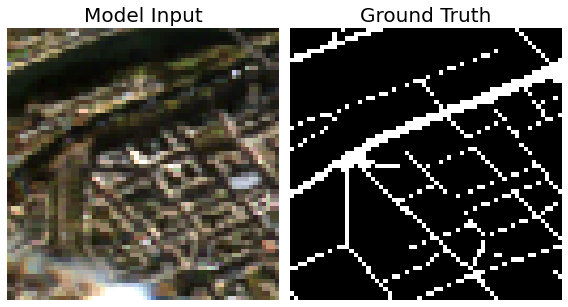

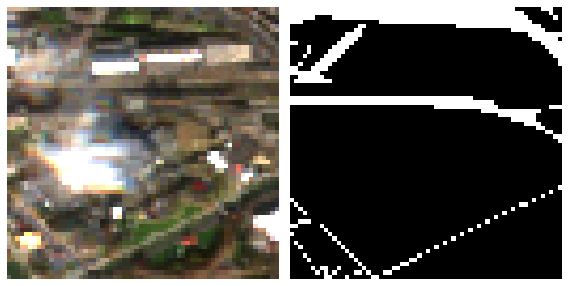

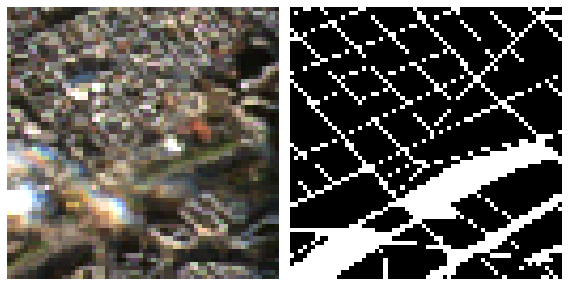

In [ ]:
samples_to_show = 3
i = 0

for data in train_dataset:
    disp_img = data[0][0]
    disp_mask = data[1][0]
    disp_mask = np.argmax(disp_mask, axis=-1)

    fig = plt.figure(figsize=(8, 10))

    ax1 = plt.subplot(1, 2, 1)
    ax1.imshow(disp_img, vmax=train_dataset.num_classes, cmap = 'tab20')
    ax1.axis("off")

    ax2 = plt.subplot(1, 2, 2)
    ax2.imshow(disp_mask, cmap = 'gray')
    ax2.axis("off")


    if i == 0:
      ax1.set_title('Model Input', fontsize = 20)
      ax2.set_title('Ground Truth', fontsize = 20)

    fig.tight_layout()

    i = i + 1

    if i == samples_to_show:
        break

## 8.2 Create Unet for training


We use the [**segmentation models**](https://segmentation-models.readthedocs.io) library to create a Unet model for semantic segmentation.

The UNET was initially used for biomedical image segmentation but is used for many image to image transalation tasks today. The UNET architecture consists of an encoder-decoder structure with skip connections in between the encoder and decoder. The encoder is responsible for downsampling our input RGB image to a latent space and the decoder is then used to generate our segmentation mask.

To read more about the UNET refer to [this](https://towardsdatascience.com/understanding-semantic-segmentation-with-unet-6be4f42d4b47/) link
<center>
<img src='https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png' width = '90%'>
</center>


Here we initialize a UNET with -


* [efficientnetb0](https://paperswithcode.com/method/efficientnet#:~:text=EfficientNet%20is%20a%20convolutional%20neural,resolution%20using%20a%20compound%20coefficient.) encoder
* input shape = (64, 64, 3)
* number of classes taken from our dataloader
* [softmax](https://deepai.org/machine-learning-glossary-and-terms/softmax-layer) activation at the final layer, since this is multiclass classification when viewed at a pixel level.
* ```encoder_freeze=True``` this means the weigths of the encoder won't be updated, only that of the decoder.
* ```encoder_weights='imagenet'``` this means that the model will be loaded with an encoder with weights trained on the imagenet for classification. To read more about why this is done, refer to this [blog on transfer learning](https://machinelearningmastery.com/transfer-learning-for-deep-learning/).


Using the paramaters we provided above, the library automatically builds a decoder on top of the specified encoder.


In [ ]:
# get number of classes from dataloader
num_classes = train_dataset.num_classes

# initialize a Unet with an efficientnet backbone
model = sm.Unet(
    backbone_name="efficientnetb0",
    input_shape=(64, 64, 3),
    classes=num_classes,
    activation="softmax",
    encoder_freeze=False,
    encoder_weights="imagenet",
)

16804768/16804768 [==============================] - 0s 0us/step


In [ ]:
print(f"Input shape: {model.layers[0].output_shape}\nOutput shape {model.layers[-1].output_shape}")

Input shape: [(None, 64, 64, 3)]
Output shape (None, 64, 64, 2)


We see that the model has an
* RGB input of ```[(None, 64, 64, 3)]``` with ```None``` representing the batch size.
* Output of size ```(None, 64, 64, 14)```. Why does it have 14 channels in the output? Shouldn't it be a single segmentation mask? The reason for this is that the model predicts the class probabilities for each class, we can use ```np.argmax``` to find which class has the highest probability to change this to a one channel mask.

## 8.3 Define model training metrics and loss

We will use a combination of the **Dice loss** and **categorical focal loss** here to train our model. The dice loss tries to measure the overlap between segmentation masks for each class and the categorical focal loss tries is a pixel wise loss.

You can read more about these losses [here](https://www.jeremyjordan.me/semantic-segmentation/#:~:text=with%20dilated%20convolutions.-,Defining%20a%20loss%20function,-The%20most%20commonly)

We use the **IoU metric** as a metric for measuring the performance of the model. IoU stands for intersection of union, it quite literally measures the intersection of segmentation masks over its union. Do note that the dice loss is a further variation of IoU.

<!-- <center> -->
<img src='https://929687.smushcdn.com/2633864/wp-content/uploads/2016/09/iou_equation.png?lossy=1&strip=1&webp=1' width='60%' >
<!-- </center> -->


In [ ]:
dice_loss = sm.losses.DiceLoss(class_weights=np.ones(num_classes))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + focal_loss

metrics = [sm.metrics.IOUScore(threshold=0.5)]

## 8.4 Train the model and visualise some results

In [ ]:
model.compile(
    tf.keras.optimizers.Adam(lr=1e-3),
    loss=total_loss,
    metrics=metrics,
)

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
history = model.fit(train_dataset, epochs=15, verbose=1)

Epoch 1/15
27/27 [==============================] - 21s 43ms/step - loss: 0.5117 - iou_score: 0.4354
Epoch 2/15
27/27 [==============================] - 1s 43ms/step - loss: 0.4515 - iou_score: 0.5008
Epoch 3/15
27/27 [==============================] - 1s 43ms/step - loss: 0.4227 - iou_score: 0.5284
Epoch 4/15
27/27 [==============================] - 1s 43ms/step - loss: 0.3965 - iou_score: 0.5525
Epoch 5/15
27/27 [==============================] - 1s 43ms/step - loss: 0.3739 - iou_score: 0.5747
Epoch 6/15
27/27 [==============================] - 1s 42ms/step - loss: 0.3587 - iou_score: 0.5879
Epoch 7/15
27/27 [==============================] - 1s 44ms/step - loss: 0.3436 - iou_score: 0.6034
Epoch 8/15
27/27 [==============================] - 1s 42ms/step - loss: 0.3267 - iou_score: 0.6189
Epoch 9/15
27/27 [==============================] - 1s 43ms/step - loss: 0.3120 - iou_score: 0.6343
Epoch 10/15
27/27 [==============================] - 1s 42ms/step - loss: 0.3027 - iou_score: 0.643

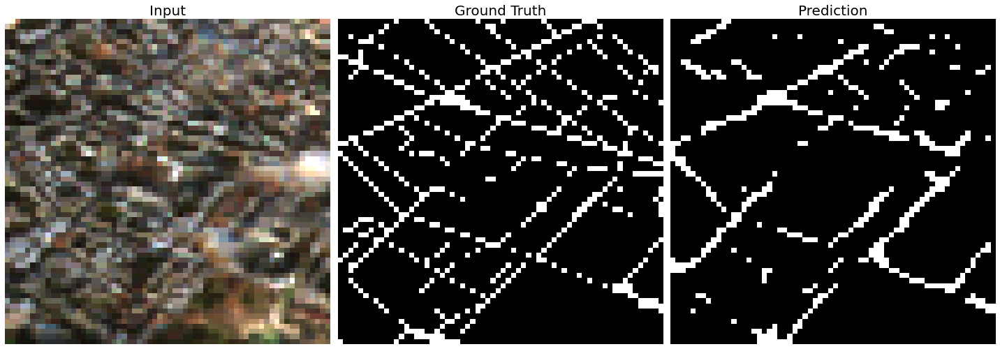

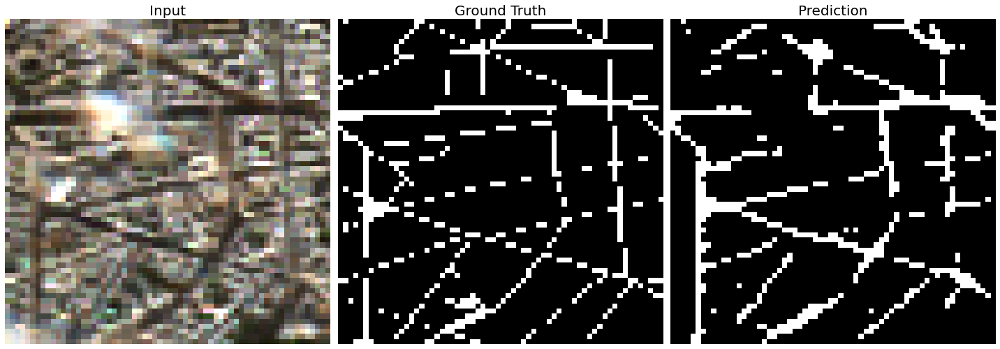

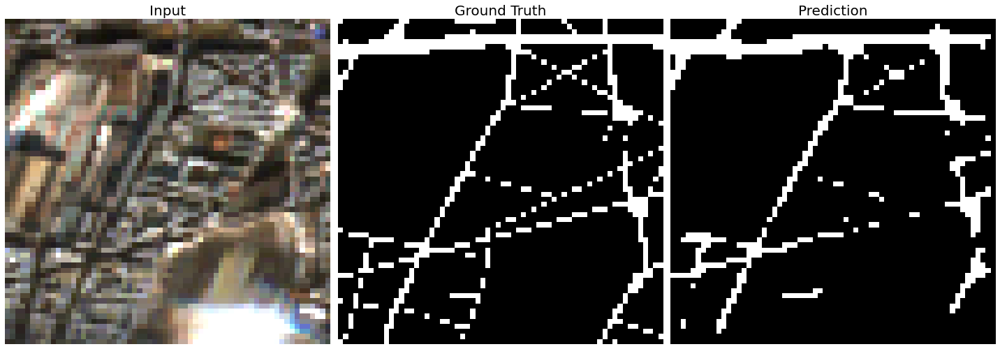

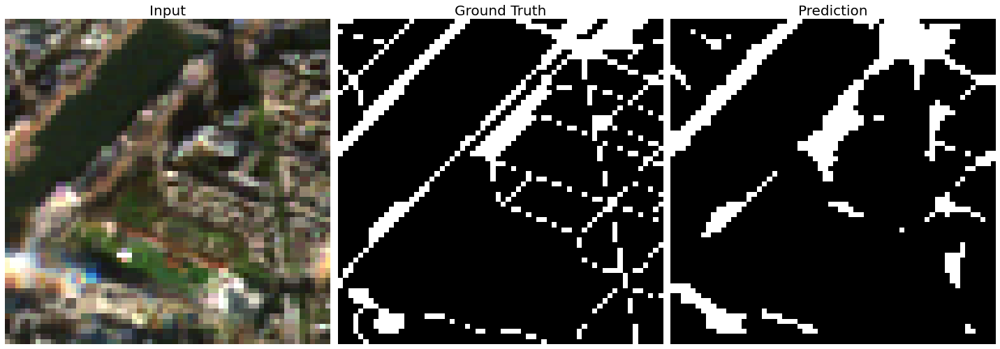

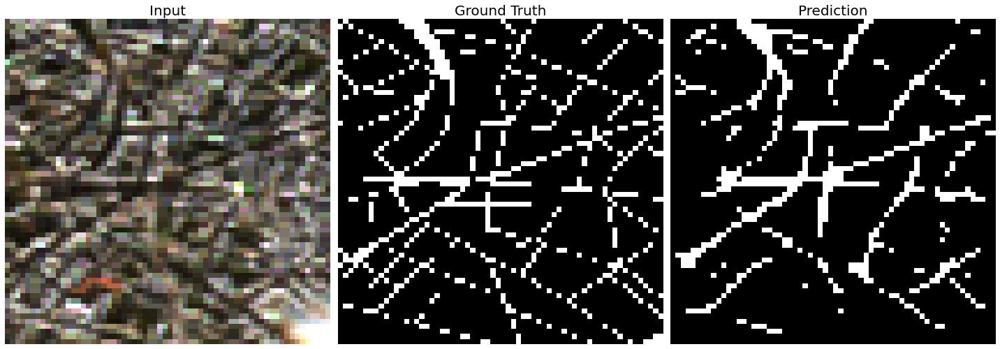

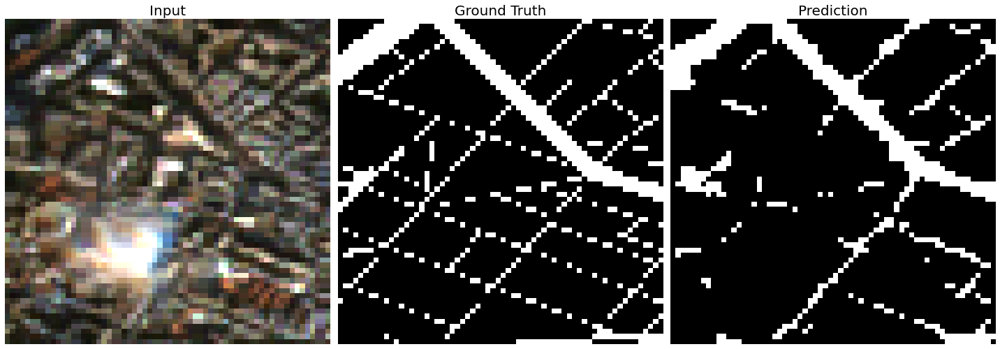

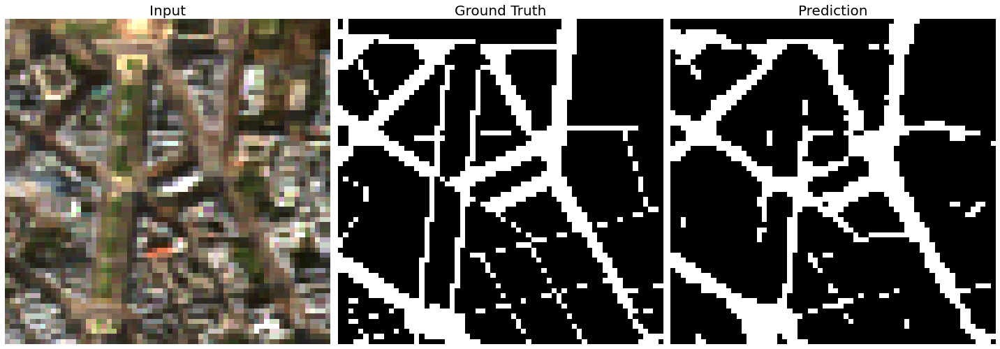

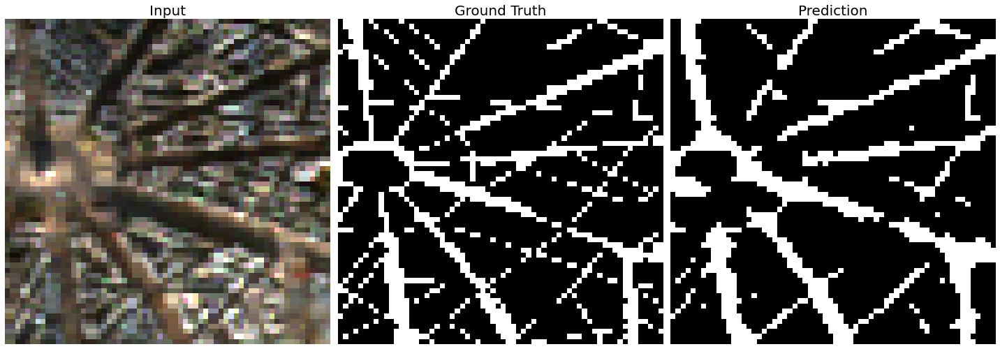

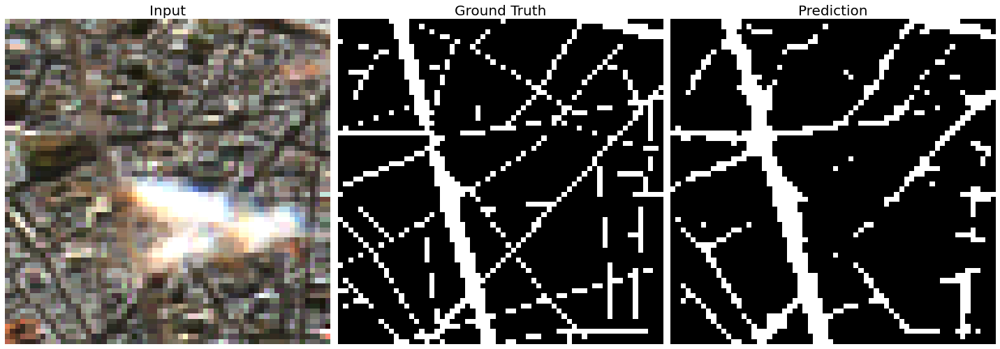

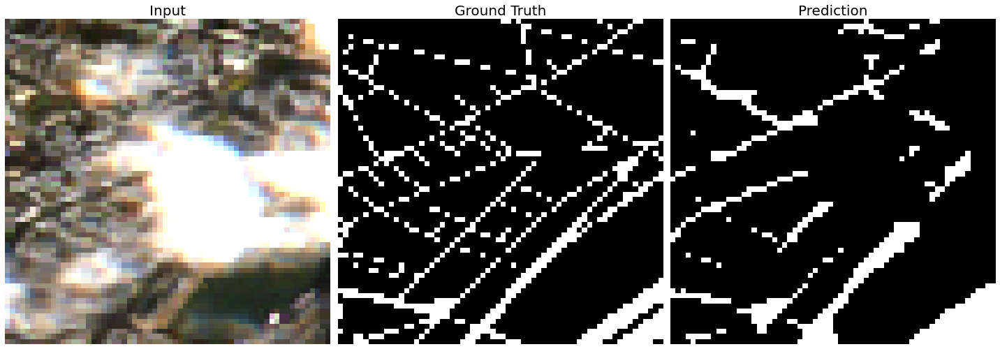

In [ ]:
samples_to_show = 10
i = 0
fs = 20

for data in train_dataset:
    # take the 0 idx data from the bacth
    disp_img = data[0][0]
    disp_mask = data[1][0]

    # get model predictions for the batch
    pred = model.predict(np.expand_dims(disp_img, 0), verbose = 0)[0]

    fig = plt.figure(figsize=(20, 20))

    # plot input RGB img
    ax = plt.subplot(1, 3, 1)
    ax.imshow(disp_img)
    ax.axis("off")
    ax.set_title("Input", fontsize = fs)

    # plot ground truth
    ax = plt.subplot(1, 3, 2)
    im = ax.imshow(np.argmax(disp_mask, axis=2), cmap = 'gray')
    ax.axis("off")
    ax.set_title("Ground Truth", fontsize = fs)

    # plot predicted mask
    disp_pred = np.argmax(pred, axis=-1)
    ax = plt.subplot(1, 3, 3)
    im = ax.imshow(disp_pred, cmap = 'gray')
    # plt.colorbar(im, fraction=0.046, pad=0.04)

    ax.axis("off")
    ax.set_title("Prediction", fontsize = fs)

    i = i + 1

    fig.tight_layout()

    if i == samples_to_show:
        break

<a name="results-and-discussion"></a>

---
# 9. Results & Discussion
---

###9.1 Model training results

Model training is not the focus of this tutorial, so we won't be discussing about it in depth in the results section.

The model has been trained to segment roads using a dataset of around 80 images, we have trained the model without any test or validation set, in practice this should not be done and was only done for the purpose of this notebook. What we can see from the model predictions is that some roads are very hard to differentiate from buildings and this is due to the resolution of the image being 10m, some objects might be too small to give fine continuous masked regions.

Also, please note that there was no train, test and validation split done here. This was due to the size of the dataset that we had, in practice always use validation strategies such as hold out test set or K fold cross validation.

###9.2 Dataset

The tutorial provides an overview of the process of creating a ML ready dataset from custom vector data. The pipeline is meant to be a template which can be used for any type of vector and satellite data pairing. Here we can discuss some further points which need to be kept in mind when creating your own dataset.

* **Dataset size** - For the purposes of this notebook we created a dataset from only a single AOI, this was done to keep the notebook simple and compact. In practicality multiple AOIs will be used to create the dataset.

* **Geographical variance** - Here the dataset was created using a very small AOI from Paris. It will probably not give good predictions for other regions from Paris containing less dense urban area let alone images from another city. It is advised to make your dataset geographically diverse, depending on your use case. If you are trying to train a remote sensing based ML model for a city, take different regions from it, if you are trying to train it for a whole country, take samples from all of the geographically diverse parts of the country.

* **Seasonal variance** - On top of geographical variance, it is also important to train on different time periods, the same area might look very different in satellite images during different seasons. Changes in vegetation cover could dramatically change the interpretation of individual images. It is recommended to take several sets of dates for different AOIs.

* **Cloud Cover** - Cloud cover is a big issue for optical data, not only for landcover segmentation but for a lot of other tasks as well. S2 does provide a SCL map as we saw above for checking for cloud cover, but it can be faulty at times, an ML based method might work better for checking for cloud cover.

* **Data quality checks** - Similar to what was done for cloud cover, different types of satellite data has other issues as well, e.g. - For SAR data from Sentinel 1, the images sometimes contain blacked out regions due to swath gaps. These issues should be kept in mind and added to the pipeline in line with the satellite being used.

* **Combining classes** - One thing we see in the EUA is that it has lots of classes, and the distinctions between some classes might not be relevant to the usecase e.g. - the EUA has 5 classes for urban fabric, including continuous urban fabric, discontinuous urban fabric etc. These classes can be combined into one as a preprocessing step as a way to reduce the model complexity.

* **Class distribution and train/test/validation split** - The train, test and validation splits should be made keeping the geographical locations in mind as well. One of the ways we created a train/test/validation for internal work was by stratifying on which source image it came from, this gave us an equal distribution of all classes between all 3 sets. We used 2 metrics to judge the distribution of classes
  1. Number of instances of each class - This shows how many images a class occurs in within a dataset.
  2. Pixel count of the class in the whole dataset - This is helpful to identify the overall pixel by pixel distribution.

  These metrics are helpful when used together. If a class has a low "number of instances" with a high "pixel count", then it means that it is representing a very big land class type like an airport. If a class has a high "number of instances" with a low "pixel count" this means that very few pixels of the object are present in a lot of images, this could be land class types such as roads.

  Do remember to normalize these metrics before comparing their distributions withing train, test and validation sets.

* **Class imbalance** - When some classes are in minority compared to others. This results in the model not learning a good representation of these classes.
This minority can be due to -

  1. class naturally occurring less. e.g - Airports wont be seen very frequently in a landcover segmentation task.

  2. Region of interest / Dataset having less of the class. e.g. - A landcover dataset from only Paris won’t have a lot of open green areas compared to a more rural city.
  
  There are some approaches which can be taken to tackle the class imbalance when training a model such as class weighting, under/oversampling, loss function selection etc. We implore you to explore these approachs.

* **Satellite spatial resolution** - The satellite's spatial resolution should be kept in mind when trying to build a landcover classification system, we saw above that in Sentinel 2 images, the smaller roads were blending in with the buildings, and this is because a lot of the roads might be only a few pixels at a 10m resolution. This should be kept in mind when combining classes as well, e.g. - roads can be combined to the urban fabric class.

## 9.3 Limitations
* **Scaling and optimisation** - The pipeline template shown here is geared more towards a tutorial and explanation format, rather than something which can be used for large deployments. Scaling and optimization are some of the largest issues faced in geospatial analysis and production. Examples of major scaling limitations are illustrated in the following points:

   *   Obtaining satellite data at large scale, years of data and thousands of individual AOIs requires large bandwidth, data storage, and compute capabilities.
   *   Processing geospatial data to match your needs (e.g. cropping, clipping, resampling, interpolation, geospatial matching) at scale requires significant parallel processing capacity
   *   The orginzation and analysis of resulting data can require complex or simply large directory structures and storage  

* **Specialized Knowledge** - Expanding machine learning training further into multispectral data (near infrared and/or shortwave infrared) or radar images, more specialized knowledge is required to process and analyze the satellite imgagery. For example, radar remote sensing requires complex pre-processing of the original data in order to even be suitable for basic analysis in most use cases. Selecting which steps to apply, how, and to have an understanding of what the results mean are pivitol for the best analysis. Likewise, using longer infrared bands in models may not be as straightforward as RGB images, and thus, knowing how the bands spectrally respond to ground phenomenon greatly helps in model development and analysis.     


* **Manual Checking** - Even though this pipeline does simplify and provide a template for creating a dataset, the dataset from the pipeline is not perfect, this can be down to a few factors. There might still be images containing clouds in them and there can be times where the data annotations aren't accurate. This is not seen a lot in a city like Paris, whose layout does not change a lot in a year, but when looking at areas in rural regions, the pasture areas, field, forests are subject to change, which leads to incorrect boundaries. This leads to a need for atleast some form of manual checking to ensure incorrect annotations are not being fed into your ML model. Being able to automate and check these incorrect annotations would be a good next step for the pipeline template.



## 9.4 Next Steps

*   The user can play around with the pipeline, trying to test different data validity limits, trying to train the model with different categories and running the pipeline with a different vector dataset. An example dataset for crop cover can be found [here](https://nassgeodata.gmu.edu/CropScape/).

*   This tutorial employs a useful, but basic, pipeline over a single AOI and date for the creation of a LULC dataset. The logical next step is to expand the scope to far more areas and over a wider range of dates. This increase will help greatly improve the model and its predictions.

*   As discussed in the **Climate Impact** section, the automation of LULC dataset creation can help in climate-related challenges and applications in several ways. A pipeline similar to this one can also be employed for crop type detection and classification. Crop classification datasets can help identify carbon offsets, better estimate carbon sinks, and help better inform farmers and stakeholders about what crops are grown and for what purpose. With the changing climate, more accurate and widespread crop information can help build resilience to disasters such as floods and droughts and help mitigate their impacts.

*   Furthermore, this tutorial uses Sentinel-2 with its, at best, 10m resolution. Depending on the climate-related application for the LULC dataset, higher or lower resolution satellite observations may be needed. For example, estimation of surface carbon, water, and energy fluxes can be improved through higher resolution observations. Whereas with regional and global climate modelling, moderate resolution observations are sufficient.

This tutorial uses basic and free services and libraries as a demonstrative tool for an ML pipeline to automatically create a basic land use and land cover dataset. As discussed in the limitations, scaling is a challenge. Platforms and services are becoming more widely available to solve these scaling problems. Some other next steps can include the incorporation of these platforms into the data download and fusion steps to allow the scale.

*   The SpaceSense platform is one example that can:
  *   Enable the search, selection, and download of Sentinel-2
  *   Fusion with the European Urban Atlas (or any custom) vector data
  *   Rasterization (resampling and interpolation), harmonization, and basic data quality checks of the data

If the features of this platform is of interest, feel free to check out [our website](https://www.spacesense.ai/) and our [python library documentation](https://spacesense.gitlab.io/client-library/overview.html).  


<a name="references"></a>
# References

[1] Sleeter, B.M., T. Loveland, G. Domke, N. Herold, J. Wickham, and N. Wood, 2018: Land Cover and Land-Use Change. In Impacts, Risks, and Adaptation in the United States: Fourth National Climate Assessment, Volume II [Reidmiller, D.R., C.W. Avery, D.R. Easterling, K.E. Kunkel, K.L.M. Lewis, T.K. Maycock, and B.C. Stewart (eds.)]. U.S. Global Change Research Program, Washington, DC, USA, pp. 202–231. doi: 10.7930/NCA4.2018.CH5

[2] Kalnay, E., and M. Cai, 2003: Impact of urbanization and land-use change on climate. Nature, 423 (6939), 528–531. doi:10.1038/nature01675.

[3] Pielke, R. A., Sr., J. Adegoke, A. BeltráN-Przekurat, C. A. Hiemstra, J. Lin, U. S. Nair, D. Niyogi, and T. E. Nobis, 2007: An overview of regional land-use and land-cover impacts on rainfall. Tellus B, 59 (3), 587–601. doi:10.1111/j.1600-0889.2007.00251.x.

[4] Reinhart, V., Hoffmann, P., Rechid, D., Böhner, J., and Bechtel, B.: High-resolution land use and land cover dataset for regional climate modelling: a plant functional type map for Europe 2015, Earth Syst. Sci. Data, 14, 1735–1794, https://doi.org/10.5194/essd-14-1735-2022, 2022.

Additional References:

*   https://sentinel.esa.int/web/sentinel/missions/sentinel-2
*   https://www.esri.com/content/dam/esrisites/en-us/media/pdf/teach-with-gis/raster-faster.pdf
* https://gisgeography.com/spatial-data-types-vector-raster/
* https://hatarilabs.com/ih-en/how-many-spectral-bands-have-the-sentinel-2-images

